In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime 
import os
from PIL import Image
import cv2

### 데이터 불러오기

In [2]:
data = pd.read_csv("/home/ubuntu/drive/EDA/merged_growth_final.csv", encoding="UTF-8")
data

,check_datetime,측정일자,구역명,farm_code,내부온도,내부습도,내부CO2,근권온도,내부순간일사량,측정년도,...,mask_id,point_x,point_y,size,color,output_image_path,origin_r,origin_g,origin_b,pred_growth
0,2021-09-10 13:00:00,2021-09-10,1구역,F0016,27.52,72.22,467.9,22.51,223.17,2021.0,...,065e7a9bdd5065fe01976ff3f4f49f03,1132.451172,554.744629,535,"[[121, 123, 112], [123, 125, 114], [118, 120, ...",image_mask_1.png,0.351564,0.406222,0.242214,unripe
1,2021-09-10 13:00:00,2021-09-10,1구역,F0016,27.52,72.22,467.9,22.51,223.17,2021.0,...,c8f4ef001e5f686be96b1cb1bb68f68d,880.826233,100.000298,37040,"[[54, 63, 44], [88, 97, 76], [82, 91, 70], [85...",image_mask_2.png,0.367803,0.445607,0.186590,unripe
2,2021-09-10 17:00:00,2021-09-10,1구역,F0016,27.02,71.23,463.1,23.77,102.75,2021.0,...,065e7a9bdd5065fe01976ff3f4f49f03,1136.085205,556.137573,576,"[[70, 71, 65], [68, 69, 63], [63, 64, 58], [49...",image_mask_1.png,0.342620,0.379780,0.277600,unripe
3,2021-09-10 17:00:00,2021-09-10,1구역,F0016,27.02,71.23,463.1,23.77,102.75,2021.0,...,3cf79ada342fb0b16364c9ea6d703f9f,771.131104,102.249115,20098,"[[22, 24, 10], [27, 30, 11], [42, 45, 24], [35...",image_mask_2.png,0.371069,0.430602,0.198329,unripe
4,2021-09-10 17:00:00,2021-09-10,1구역,F0016,27.02,71.23,463.1,23.77,102.75,2021.0,...,fd48e0393a4d25876b5fb82e9571361e,902.543579,109.905945,22199,"[[97, 93, 92], [80, 79, 77], [85, 84, 80], [83...",image_mask_3.png,0.367177,0.417558,0.215264,unripe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134325,NaN,NaN,NaN,F0017,NaN,NaN,NaN,NaN,NaN,NaN,...,0cb9c5737f7de38bb2f75f064bd96a55,252.157288,679.823486,752,"[[159, 173, 137], [139, 154, 113], [101, 116, ...",image_mask_5.png,0.342348,0.385022,0.272630,unripe
134326,NaN,NaN,NaN,F0017,NaN,NaN,NaN,NaN,NaN,NaN,...,a778f0bf971bd81561020a9b5cab4043,111.124481,661.383179,1207,"[[58, 67, 48], [72, 81, 62], [90, 99, 82], [11...",image_mask_6.png,0.339128,0.366072,0.294800,unripe
134327,NaN,NaN,NaN,F0017,NaN,NaN,NaN,NaN,NaN,NaN,...,0146404d3a59c2af51d446bc348f9ca0,545.385010,625.948486,816,"[[67, 79, 41], [51, 63, 23], [33, 46, 3], [67,...",image_mask_7.png,0.346549,0.384828,0.268623,unripe
134328,NaN,NaN,NaN,F0017,NaN,NaN,NaN,NaN,NaN,NaN,...,774d0e20df9ee526e506a822cca77538,586.503967,478.773376,1269,"[[116, 140, 92], [182, 206, 156], [197, 221, 1...",image_mask_8.png,0.350770,0.386644,0.262587,unripe


### F0016 23-24작기

In [7]:
F0016_period_23_24

,check_datetime,farm_code,area_code,input_image_name,input_image_path,before_img_name,img_id,count_masks,mask_num,mask_id,output_image_path,pred_growth
39979,2023-09-05 16:40:00,F0016,C101,F0016-C101-20230905-164021,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20230905-124018,1f6e34d4f8852097d854cc2820d786fe,1.0,F0016-C101-20230905-164021_1,07e4846542447d3dd9831ecd427e7917,image_mask_1.png,unripe
39980,2023-09-07 16:40:00,F0016,C101,F0016-C101-20230907-164022,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20230907-124024,70c3fed6f01a2924fdefb8ef1631dc37,2.0,F0016-C101-20230907-164022_1,a93d13c6b57f5f4bff6eb00a71fcca38,image_mask_1.png,unripe
39981,2023-09-07 16:40:00,F0016,C101,F0016-C101-20230907-164022,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20230907-124024,70c3fed6f01a2924fdefb8ef1631dc37,2.0,F0016-C101-20230907-164022_2,07e4846542447d3dd9831ecd427e7917,image_mask_2.png,unripe
39982,2023-09-08 08:40:00,F0016,C101,F0016-C101-20230908-084144,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20230907-164022,f79363949d47f6ca0116ff6c86090dbd,1.0,F0016-C101-20230908-084144_1,8e7814f8f1344084f2f5b2b35fdaf535,image_mask_1.png,unripe
39983,2023-09-08 16:40:00,F0016,C101,F0016-C101-20230908-164108,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20230908-124136,cc94fd024d80c4610ba8971b62431f19,1.0,F0016-C101-20230908-164108_1,07e4846542447d3dd9831ecd427e7917,image_mask_1.png,unripe
...,...,...,...,...,...,...,...,...,...,...,...,...
46062,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_5,dade7dd70597d7c1a73e70099c9eda42,image_mask_5.png,unripe
46063,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_6,4324212bf0c794ff90cd1276ee1d5621,image_mask_6.png,semi-ripe
46064,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_7,bad432cad0ff1b16f3e82ecae2708ad7,image_mask_7.png,semi-ripe
46065,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_8,f055a1592115fbd15c9be4bcb20eb97d,image_mask_8.png,semi-ripe


#### F0016 22-23 11월

In [8]:
# 11월 데이터만 선택하여 저장
F0016_23_24_nov = F0016_period_23_24[(F0016_period_23_24['check_datetime'].dt.month == 11) & (F0016_period_23_24['check_datetime'].dt.year == 2023)]
F0016_23_24_nov

#11월-1월 데이터 선택 
F0016_23_24_nov_to_jan = F0016_period_23_24[(F0016_period_23_24['check_datetime'].dt.month == 11) & (F0016_period_23_24['check_datetime'].dt.year == 2023) | (F0016_period_23_24['check_datetime'].dt.month == 1) & (F0016_period_23_24['check_datetime'].dt.year == 2024)]
F0016_23_24_nov_to_jan

,check_datetime,farm_code,area_code,input_image_name,input_image_path,before_img_name,img_id,count_masks,mask_num,mask_id,output_image_path,pred_growth
39985,2023-11-01 16:40:00,F0016,C101,F0016-C101-20231101-164132,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231101-124037,3ad67d13f9ad26c0e6dc3482fe03a223,2.0,F0016-C101-20231101-164132_1,b2e0b7b4a906ab8a36cc494b09316dec,image_mask_1.png,unripe
39986,2023-11-01 16:40:00,F0016,C101,F0016-C101-20231101-164132,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231101-124037,3ad67d13f9ad26c0e6dc3482fe03a223,2.0,F0016-C101-20231101-164132_2,355a61086a45ac182cbb5471a69f9f54,image_mask_2.png,unripe
39987,2023-11-07 16:40:00,F0016,C101,F0016-C101-20231107-164037,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231107-124038,b4345847bf0e6b7995e36bcf2413cb52,1.0,F0016-C101-20231107-164037_1,8131ff7c3b144c1695eb5aaebbb5b764,image_mask_1.png,unripe
39988,2023-11-29 08:40:00,F0016,C101,F0016-C101-20231129-084453,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231128-164455,9808b92812717f1b535499f8b7dfab32,1.0,F0016-C101-20231129-084453_1,dbd4ee3c2fa2cb10240f88cb6e91689a,image_mask_1.png,unripe
39989,2023-11-30 08:40:00,F0016,C101,F0016-C101-20231130-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231129-164448,1bb2335060671f4c8c9950517da1145f,1.0,F0016-C101-20231130-084446_1,99e961751d7ff9ca3d6196450b35665a,image_mask_1.png,unripe
...,...,...,...,...,...,...,...,...,...,...,...,...
43349,2024-01-31 16:40:00,F0016,C101,F0016-C101-20240131-164448,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240131-124456,ce9707cd37738f785a65924207ab1d78,12.0,F0016-C101-20240131-164448_5,d115248191bdf6b45d1cdceaf31eca3f,image_mask_5.png,semi-ripe
43350,2024-01-31 16:40:00,F0016,C101,F0016-C101-20240131-164448,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240131-124456,ce9707cd37738f785a65924207ab1d78,12.0,F0016-C101-20240131-164448_6,b4146beec75bf3fbd7c341ba74954f52,image_mask_6.png,semi-ripe
43351,2024-01-31 16:40:00,F0016,C101,F0016-C101-20240131-164448,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240131-124456,ce9707cd37738f785a65924207ab1d78,12.0,F0016-C101-20240131-164448_7,adf7b0443d1076552ab71b91d1fa3f9b,image_mask_7.png,semi-ripe
43352,2024-01-31 16:40:00,F0016,C101,F0016-C101-20240131-164448,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240131-124456,ce9707cd37738f785a65924207ab1d78,12.0,F0016-C101-20240131-164448_8,d5a3fccfb1f2fd2abb55b47693880b31,image_mask_8.png,semi-ripe


In [9]:
# img_id별 mask_id 개수 계산
img_id_mask_count = F0016_23_24_nov.groupby('img_id')['mask_id'].count().reset_index()
print(img_id_mask_count.sort_values(by='mask_id', ascending=False))

                             img_id  mask_id
1  3ad67d13f9ad26c0e6dc3482fe03a223        2
0  1bb2335060671f4c8c9950517da1145f        1
2  9808b92812717f1b535499f8b7dfab32        1
3  b4345847bf0e6b7995e36bcf2413cb52        1


In [10]:
F0016_23_24_nov[F0016_23_24_nov['img_id'] == '3ad67d13f9ad26c0e6dc3482fe03a223']

,check_datetime,farm_code,area_code,input_image_name,input_image_path,before_img_name,img_id,count_masks,mask_num,mask_id,output_image_path,pred_growth
39985,2023-11-01 16:40:00,F0016,C101,F0016-C101-20231101-164132,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231101-124037,3ad67d13f9ad26c0e6dc3482fe03a223,2.0,F0016-C101-20231101-164132_1,b2e0b7b4a906ab8a36cc494b09316dec,image_mask_1.png,unripe
39986,2023-11-01 16:40:00,F0016,C101,F0016-C101-20231101-164132,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231101-124037,3ad67d13f9ad26c0e6dc3482fe03a223,2.0,F0016-C101-20231101-164132_2,355a61086a45ac182cbb5471a69f9f54,image_mask_2.png,unripe


In [11]:
# 'img_id'가 'ff35b4b9bc505daa988376c9f38b3b99'인 데이터에서 필요한 열만 선택
img_data_16_23_nov = F0016_23_24_nov[F0016_23_24_nov['img_id'] == '3ad67d13f9ad26c0e6dc3482fe03a223'][['check_datetime', 'input_image_name','output_image_path', 'pred_growth', 'mask_id']]

img_data_16_23_nov

,check_datetime,input_image_name,output_image_path,pred_growth,mask_id
39985,2023-11-01 16:40:00,F0016-C101-20231101-164132,image_mask_1.png,unripe,b2e0b7b4a906ab8a36cc494b09316dec
39986,2023-11-01 16:40:00,F0016-C101-20231101-164132,image_mask_2.png,unripe,355a61086a45ac182cbb5471a69f9f54


mask_id: b2e0b7b4a906ab8a36cc494b09316dec


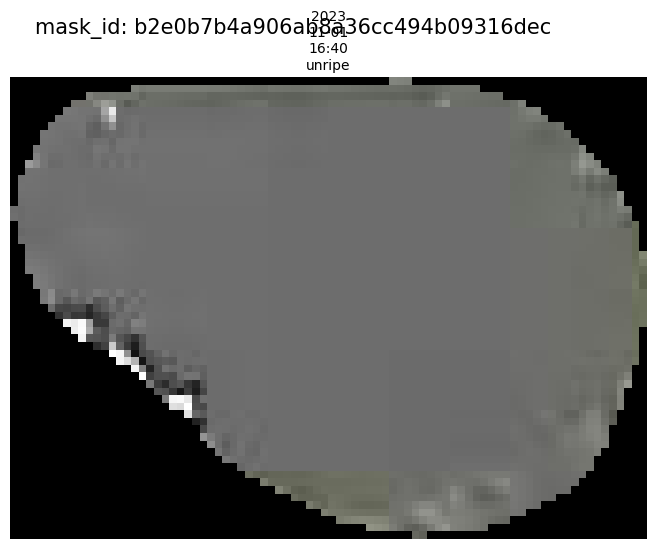

mask_id: 355a61086a45ac182cbb5471a69f9f54


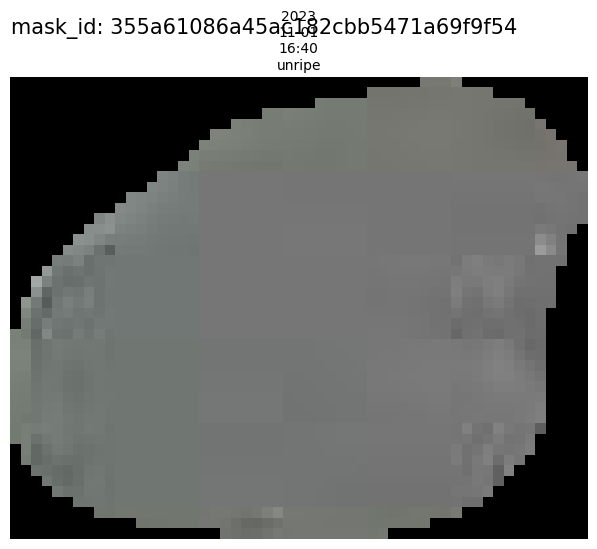

In [12]:
# 주어진 mask_id들이 포함된 데이터 추출
filtered_data = F0016_23_24_nov_to_jan[F0016_23_24_nov_to_jan['mask_id'].isin(img_data_16_23_nov['mask_id'].unique())]

# mask_id별로 최신 날짜순으로 정렬하고 필요한 정보 저장
mask_info_list = []
for mask_id in img_data_16_23_nov['mask_id'].unique():
    mask_data = filtered_data[filtered_data['mask_id'] == mask_id]
    sorted_mask_data = mask_data.sort_values(by='check_datetime', ascending=True)
    mask_info_list.append(sorted_mask_data)

# 각 mask_id별로 시각화
for mask_info in mask_info_list:
    mask_id = mask_info['mask_id'].iloc[0]

    # 각 mask_id를 출력
    print("mask_id:", mask_id)
    
    # 각 mask_id별로 등장한 일자순으로 시각화
    fig, axes = plt.subplots(1, len(mask_info), figsize=(28, 6))
    fig.suptitle(f'mask_id: {mask_id}', fontsize=15)
    
    for i, (_, row) in enumerate(mask_info.iterrows()):
        img_path = "/home/ubuntu/drive/dataset/SAM_result/F0016/C101/" + row['input_image_name'] + "/masks/" + row["output_image_path"]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # 이미지와 관련 정보 시각화
        check_datetime_formatted_year = row["check_datetime"].strftime("%Y")
        check_datetime_formatted_day = row["check_datetime"].strftime("%m-%d")
        check_datetime_formatted = row["check_datetime"].strftime("%H:%M")
        pred_growth = row["pred_growth"]
        title = f'{check_datetime_formatted_year}\n{check_datetime_formatted_day}\n{check_datetime_formatted}\n{pred_growth}'
        np.ravel(axes)[i].imshow(img)
        np.ravel(axes)[i].set_title(title, fontsize=10)
        np.ravel(axes)[i].axis('off')

    plt.show()

#### F0016 22-23 12월

In [13]:
# 11월 데이터만 선택하여 저장
F0016_23_24_dec = F0016_period_23_24[(F0016_period_23_24['check_datetime'].dt.month == 12) & (F0016_period_23_24['check_datetime'].dt.year == 2023)]
F0016_23_24_dec

#11월-1월 데이터 선택 
FF0016_23_24_dec_to_feb = F0016_period_23_24[(F0016_period_23_24['check_datetime'].dt.month >= 12) | (F0016_period_23_24['check_datetime'].dt.month <= 2)]
FF0016_23_24_dec_to_feb

,check_datetime,farm_code,area_code,input_image_name,input_image_path,before_img_name,img_id,count_masks,mask_num,mask_id,output_image_path,pred_growth
39990,2023-12-01 08:40:00,F0016,C101,F0016-C101-20231201-084443,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231130-164442,80af333c59fc674c9f93de5dc9631cb1,2.0,F0016-C101-20231201-084443_1,8948b7b7137253782df1785d7f8a7672,image_mask_1.png,unripe
39991,2023-12-01 08:40:00,F0016,C101,F0016-C101-20231201-084443,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231130-164442,80af333c59fc674c9f93de5dc9631cb1,2.0,F0016-C101-20231201-084443_2,d1a11364588b588a85bdc46b49ad9298,image_mask_2.png,unripe
39992,2023-12-03 08:40:00,F0016,C101,F0016-C101-20231203-084450,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231202-164455,958496d8913ae478442e5b315512dff3,1.0,F0016-C101-20231203-084450_1,8948b7b7137253782df1785d7f8a7672,image_mask_1.png,unripe
39993,2023-12-04 08:40:00,F0016,C101,F0016-C101-20231204-084448,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231203-164451,800a85fa44ece498ca3cf5ffcae62b81,2.0,F0016-C101-20231204-084448_1,8948b7b7137253782df1785d7f8a7672,image_mask_1.png,unripe
39994,2023-12-04 08:40:00,F0016,C101,F0016-C101-20231204-084448,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231203-164451,800a85fa44ece498ca3cf5ffcae62b81,2.0,F0016-C101-20231204-084448_2,e12822d6bb3aede0c85943f6911b36ee,image_mask_2.png,unripe
...,...,...,...,...,...,...,...,...,...,...,...,...
44792,2024-02-29 16:40:00,F0016,C101,F0016-C101-20240229-164446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240229-124454,d63081870e9209ff0ea26e67c611d997,12.0,F0016-C101-20240229-164446_5,8f5c8adbb65e929e4ce9189d91e9889f,image_mask_5.png,semi-ripe
44793,2024-02-29 16:40:00,F0016,C101,F0016-C101-20240229-164446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240229-124454,d63081870e9209ff0ea26e67c611d997,12.0,F0016-C101-20240229-164446_6,f8346cfe9c7a6b5c2a83d2d1a6a17dca,image_mask_6.png,semi-ripe
44794,2024-02-29 16:40:00,F0016,C101,F0016-C101-20240229-164446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240229-124454,d63081870e9209ff0ea26e67c611d997,12.0,F0016-C101-20240229-164446_7,753d4b74b0c37f0ef8577ac88e06f949,image_mask_7.png,semi-ripe
44795,2024-02-29 16:40:00,F0016,C101,F0016-C101-20240229-164446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240229-124454,d63081870e9209ff0ea26e67c611d997,12.0,F0016-C101-20240229-164446_8,4e044e80f68cd39342f01990e741120a,image_mask_8.png,semi-ripe


In [14]:
# img_id별 mask_id 개수 계산
img_id_mask_count = F0016_23_24_dec.groupby('img_id')['mask_id'].count().reset_index()
print(img_id_mask_count.sort_values(by='mask_id', ascending=False))

                              img_id  mask_id
34  84a79d1eb3ec1bd4b5db0e4d2814766a       35
47  b46916a666f61f904ea55e875b729b6b       29
70  e8622ddf85e9d47a16acdd8884ddcb23       28
54  c8167bd303e044b8c1b0a065b51d28be       28
77  fab9b3aab114037c9fbe097ac2746c04       25
..                               ...      ...
40  93c67934943f9567efbbc671fb178dee        1
73  ef17aa7ec334fa5afc72f02835f7b95b        1
63  d834c610eaa14aa38a434ee18fba4c45        1
9   2acb16f3c9b129ca34d3e0b969f8f3bf        1
46  a854ad9ab380f50bb880ff538f9c371e        1

[78 rows x 2 columns]


In [15]:
F0016_23_24_dec[F0016_23_24_dec['img_id'] == '84a79d1eb3ec1bd4b5db0e4d2814766a']

,check_datetime,farm_code,area_code,input_image_name,input_image_path,before_img_name,img_id,count_masks,mask_num,mask_id,output_image_path,pred_growth
40350,2023-12-27 08:40:00,F0016,C101,F0016-C101-20231227-084445,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231226-164445,84a79d1eb3ec1bd4b5db0e4d2814766a,35.0,F0016-C101-20231227-084445_1,3b305dbfd6fe7e82eb8936e1898e6fdb,image_mask_1.png,semi-ripe
40351,2023-12-27 08:40:00,F0016,C101,F0016-C101-20231227-084445,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231226-164445,84a79d1eb3ec1bd4b5db0e4d2814766a,35.0,F0016-C101-20231227-084445_10,9293afe4ad2ea898ba55439f32ca0c19,image_mask_10.png,semi-ripe
40352,2023-12-27 08:40:00,F0016,C101,F0016-C101-20231227-084445,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231226-164445,84a79d1eb3ec1bd4b5db0e4d2814766a,35.0,F0016-C101-20231227-084445_11,cd0746e45f194d4e0d0340b83d17e17d,image_mask_11.png,semi-ripe
40353,2023-12-27 08:40:00,F0016,C101,F0016-C101-20231227-084445,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231226-164445,84a79d1eb3ec1bd4b5db0e4d2814766a,35.0,F0016-C101-20231227-084445_12,623a49a223d4a11c4271cc4c3fff36dd,image_mask_12.png,unripe
40354,2023-12-27 08:40:00,F0016,C101,F0016-C101-20231227-084445,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231226-164445,84a79d1eb3ec1bd4b5db0e4d2814766a,35.0,F0016-C101-20231227-084445_13,21ff6eb6a0b7bdfffa0050bdf87889f9,image_mask_13.png,semi-ripe
40355,2023-12-27 08:40:00,F0016,C101,F0016-C101-20231227-084445,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231226-164445,84a79d1eb3ec1bd4b5db0e4d2814766a,35.0,F0016-C101-20231227-084445_14,9293afe4ad2ea898ba55439f32ca0c19,image_mask_14.png,semi-ripe
40356,2023-12-27 08:40:00,F0016,C101,F0016-C101-20231227-084445,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231226-164445,84a79d1eb3ec1bd4b5db0e4d2814766a,35.0,F0016-C101-20231227-084445_15,221f078d8b0d2dcadd884396a9e6b75b,image_mask_15.png,ripe
40357,2023-12-27 08:40:00,F0016,C101,F0016-C101-20231227-084445,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231226-164445,84a79d1eb3ec1bd4b5db0e4d2814766a,35.0,F0016-C101-20231227-084445_16,7a4fc4e1e2d1effd10efcad5647ffa51,image_mask_16.png,unripe
40358,2023-12-27 08:40:00,F0016,C101,F0016-C101-20231227-084445,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231226-164445,84a79d1eb3ec1bd4b5db0e4d2814766a,35.0,F0016-C101-20231227-084445_17,a3035ad063290a107b3eda08f9e2c21f,image_mask_17.png,semi-ripe
40359,2023-12-27 08:40:00,F0016,C101,F0016-C101-20231227-084445,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231226-164445,84a79d1eb3ec1bd4b5db0e4d2814766a,35.0,F0016-C101-20231227-084445_18,cc48dccb8982f8bbbe4e3a30c9e86f1d,image_mask_18.png,ripe


In [16]:
# 'img_id'가 'ff35b4b9bc505daa988376c9f38b3b99'인 데이터에서 필요한 열만 선택
img_data_16_23_dec = F0016_23_24_dec[F0016_23_24_dec['img_id'] == '84a79d1eb3ec1bd4b5db0e4d2814766a'][['check_datetime', 'input_image_name','output_image_path', 'pred_growth', 'mask_id']]

img_data_16_23_dec

,check_datetime,input_image_name,output_image_path,pred_growth,mask_id
40350,2023-12-27 08:40:00,F0016-C101-20231227-084445,image_mask_1.png,semi-ripe,3b305dbfd6fe7e82eb8936e1898e6fdb
40351,2023-12-27 08:40:00,F0016-C101-20231227-084445,image_mask_10.png,semi-ripe,9293afe4ad2ea898ba55439f32ca0c19
40352,2023-12-27 08:40:00,F0016-C101-20231227-084445,image_mask_11.png,semi-ripe,cd0746e45f194d4e0d0340b83d17e17d
40353,2023-12-27 08:40:00,F0016-C101-20231227-084445,image_mask_12.png,unripe,623a49a223d4a11c4271cc4c3fff36dd
40354,2023-12-27 08:40:00,F0016-C101-20231227-084445,image_mask_13.png,semi-ripe,21ff6eb6a0b7bdfffa0050bdf87889f9
40355,2023-12-27 08:40:00,F0016-C101-20231227-084445,image_mask_14.png,semi-ripe,9293afe4ad2ea898ba55439f32ca0c19
40356,2023-12-27 08:40:00,F0016-C101-20231227-084445,image_mask_15.png,ripe,221f078d8b0d2dcadd884396a9e6b75b
40357,2023-12-27 08:40:00,F0016-C101-20231227-084445,image_mask_16.png,unripe,7a4fc4e1e2d1effd10efcad5647ffa51
40358,2023-12-27 08:40:00,F0016-C101-20231227-084445,image_mask_17.png,semi-ripe,a3035ad063290a107b3eda08f9e2c21f
40359,2023-12-27 08:40:00,F0016-C101-20231227-084445,image_mask_18.png,ripe,cc48dccb8982f8bbbe4e3a30c9e86f1d


mask_id: 3b305dbfd6fe7e82eb8936e1898e6fdb


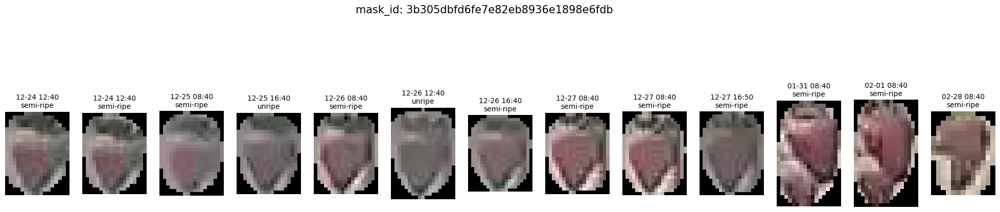

mask_id: 9293afe4ad2ea898ba55439f32ca0c19


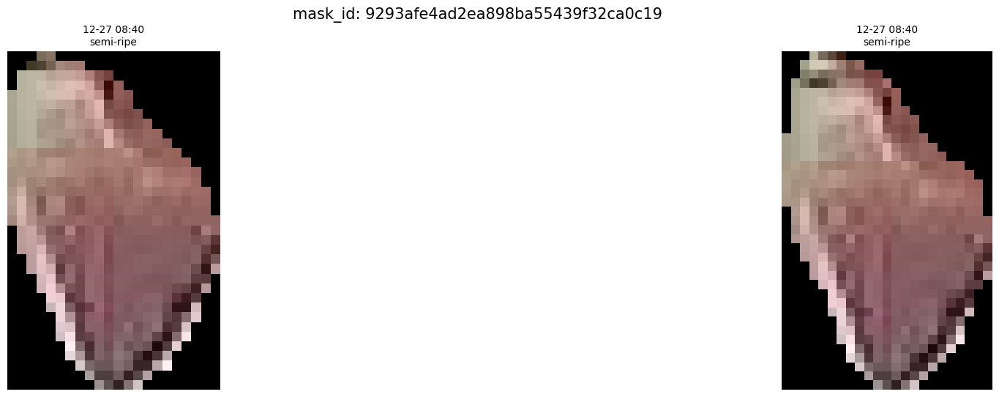

mask_id: cd0746e45f194d4e0d0340b83d17e17d


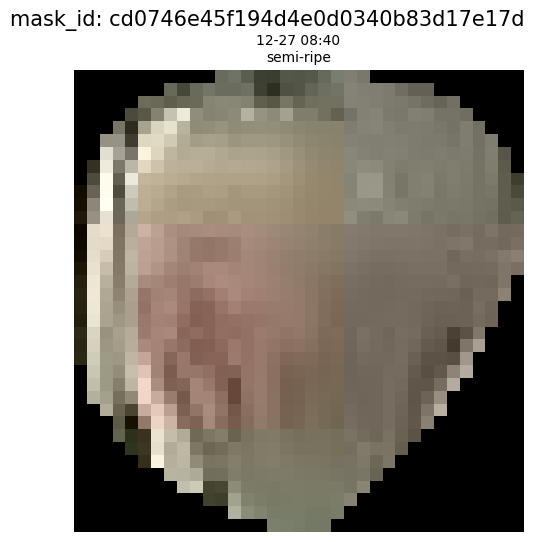

mask_id: 623a49a223d4a11c4271cc4c3fff36dd


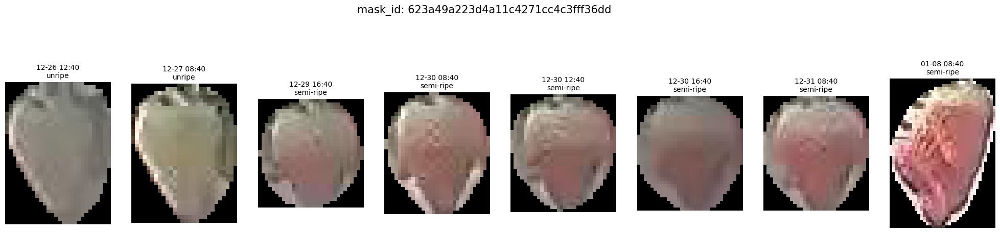

mask_id: 21ff6eb6a0b7bdfffa0050bdf87889f9


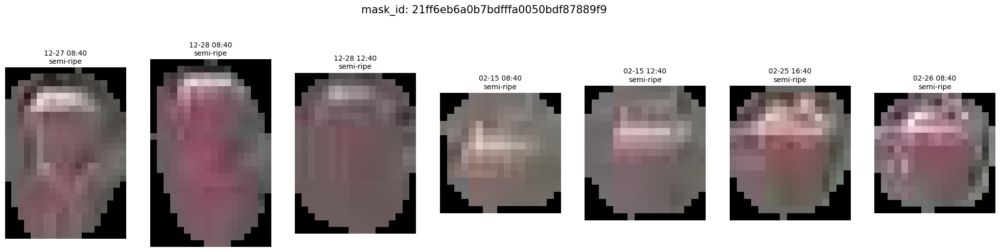

mask_id: 221f078d8b0d2dcadd884396a9e6b75b


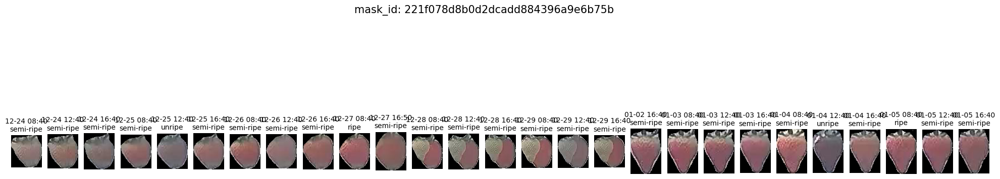

mask_id: 7a4fc4e1e2d1effd10efcad5647ffa51


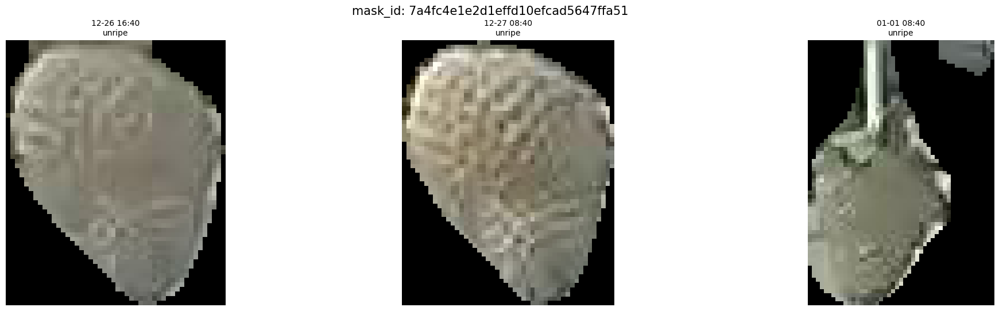

mask_id: a3035ad063290a107b3eda08f9e2c21f


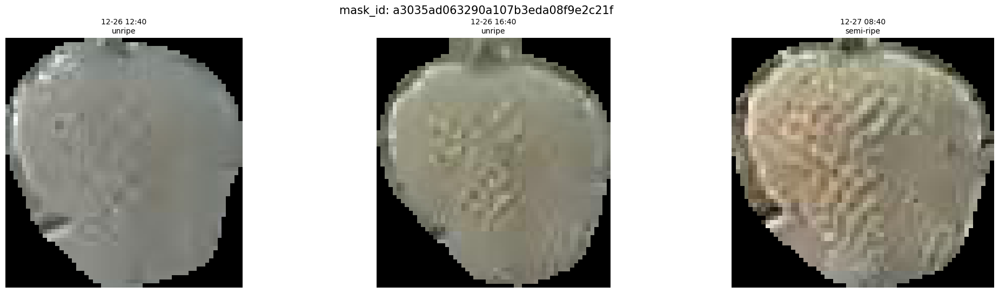

mask_id: cc48dccb8982f8bbbe4e3a30c9e86f1d


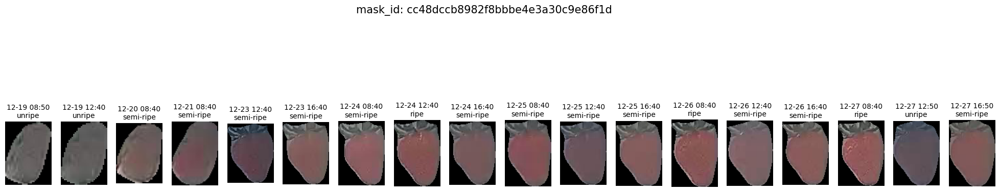

mask_id: e6843c9167ed852adffd907e57cbfa32


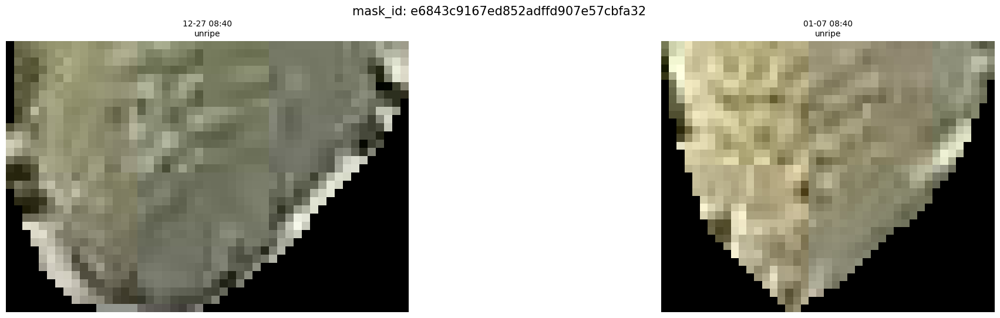

mask_id: d1a11364588b588a85bdc46b49ad9298


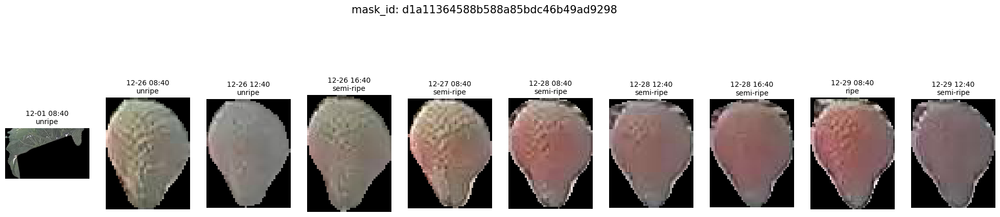

mask_id: 4ba8625be06ae6bf87c9a88c6c578573


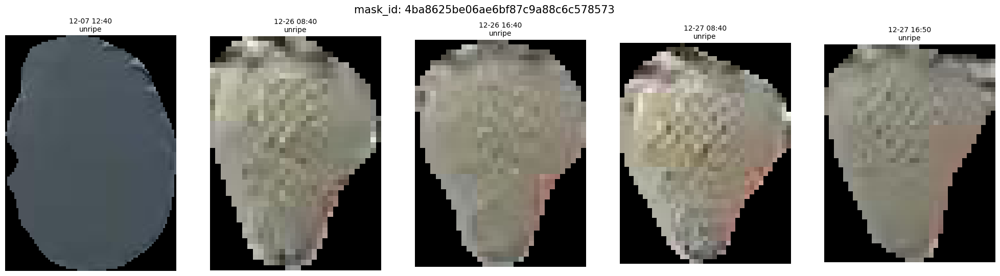

mask_id: f5200039a2be25d0c0a42cc4f28cb9cb


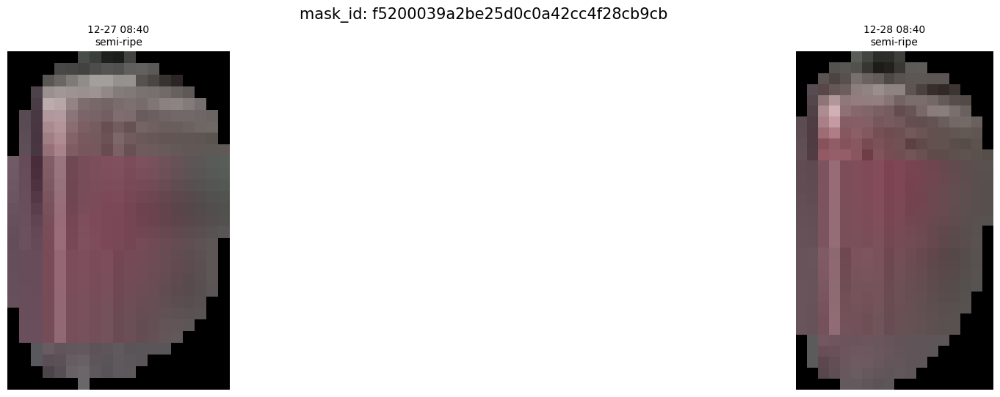

mask_id: 39744d9b85ab955c4afcee37eeea4ac6


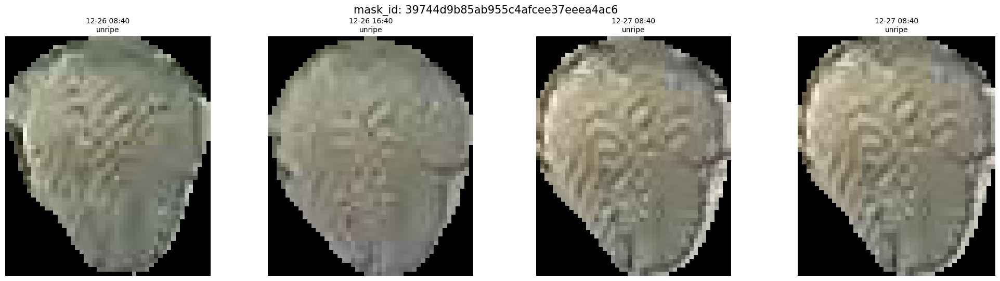

mask_id: 90a04696259a30cc47ca415116e21416


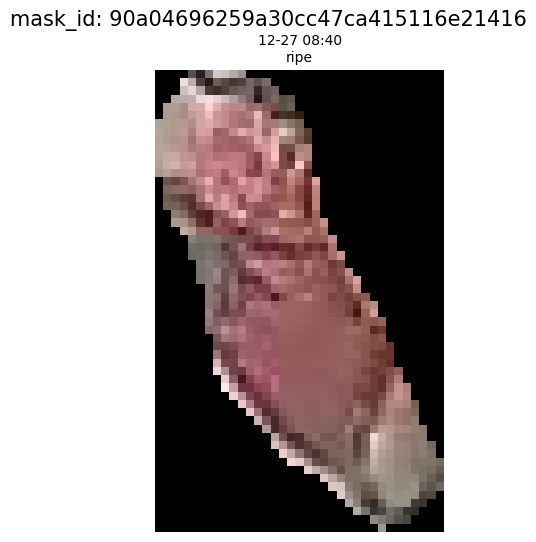

mask_id: 7aaf2ec6cfdef468d5ae503a3d00ae28


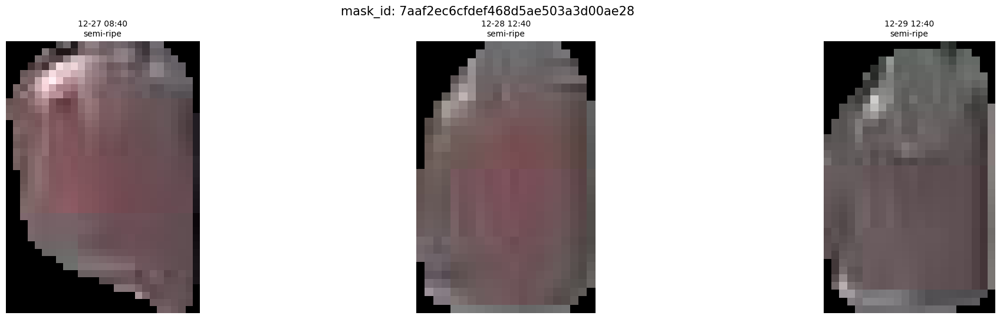

mask_id: bc5c0b6a9b95a35354f28d3ffa1abe60


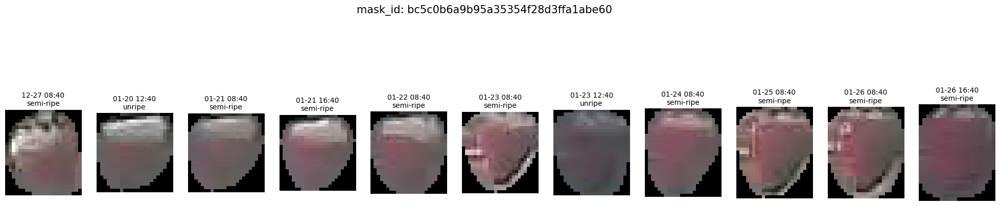

mask_id: 6ab29b33c18cd9d798b9e350c48ad15e


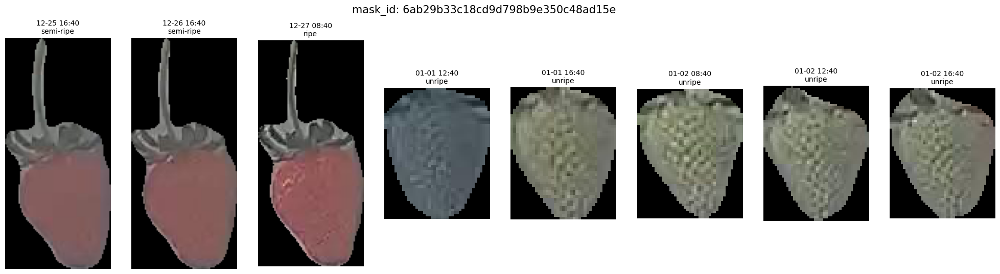

mask_id: a455f1ee4bbffe91a7d61a039dfba003


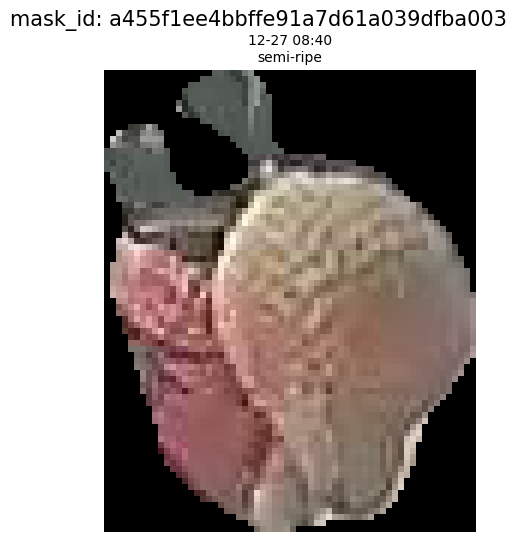

mask_id: dfb6e455d95d6f993607e65a10aac3a3


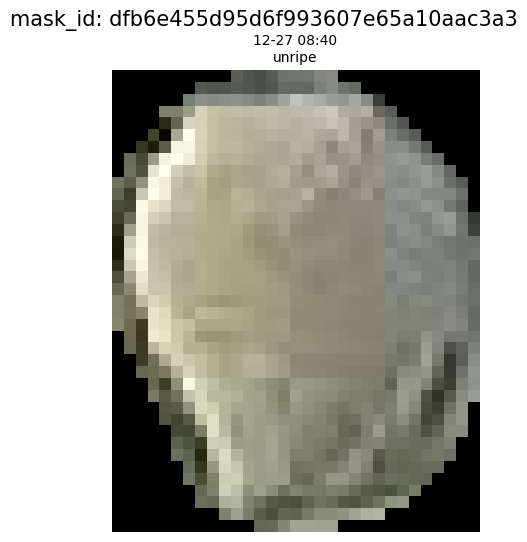

mask_id: b2055147f4b064517d043ed814cb8b50


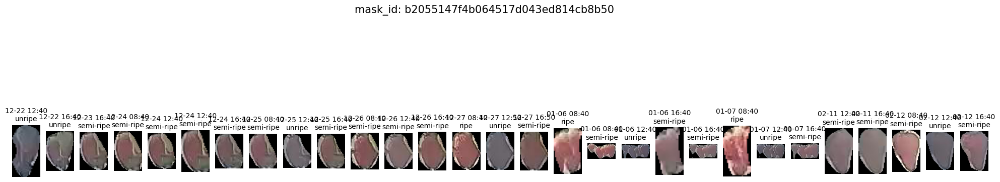

mask_id: 7da5e05475d688c7a0923e02ed358ef3


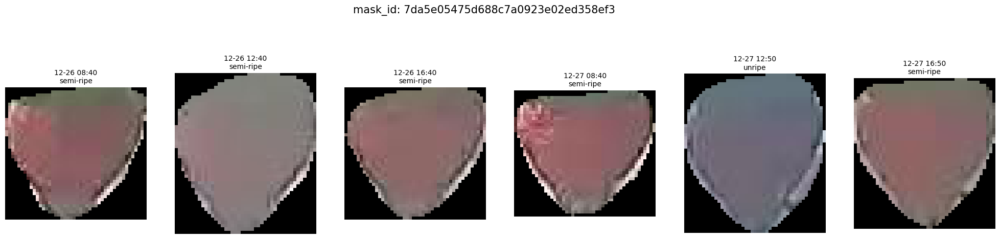

mask_id: 285809b89acbe530cc1092d9890f26e4


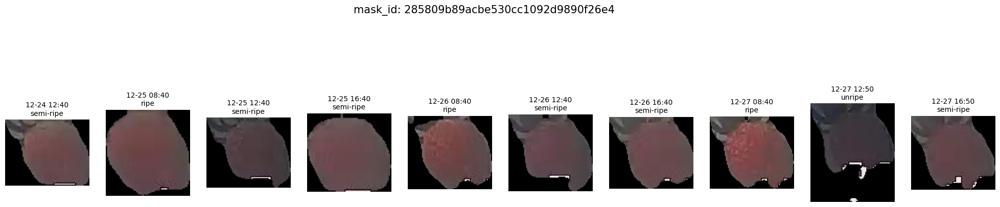

mask_id: 695c1e600c43d32aadb5daf1b5db3f6c


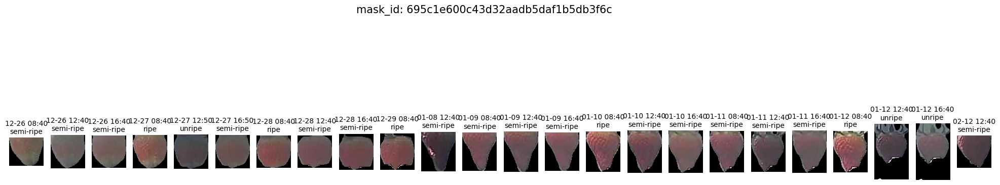

mask_id: 79bfec736f169de7ad95f798ac95e8d0


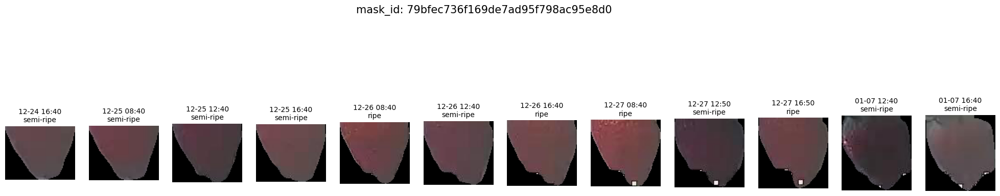

mask_id: 10d18b0e8cf0708b88bef000f0177ec8


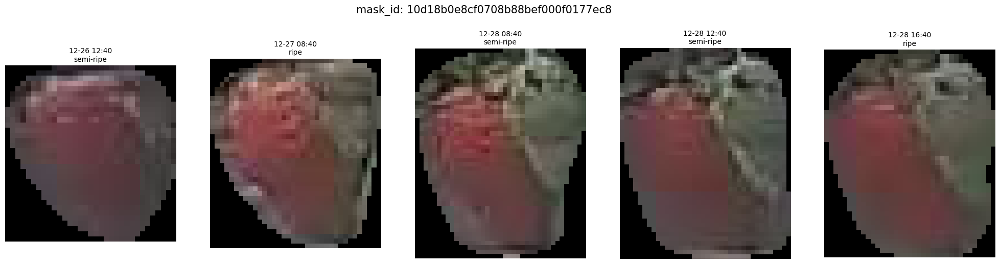

mask_id: f4e6bd22f2626d85e6944ad449983df5


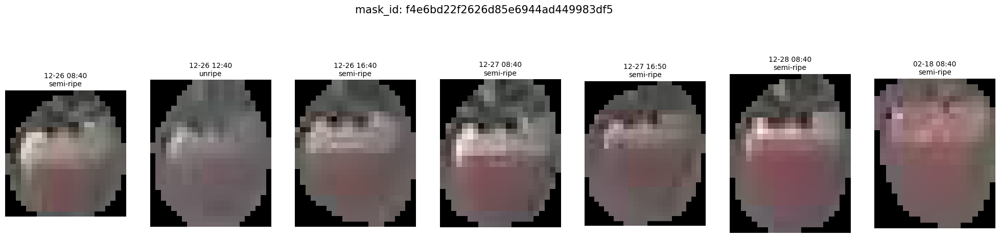

mask_id: e25f55fff3badad69ba330c3fefaaded


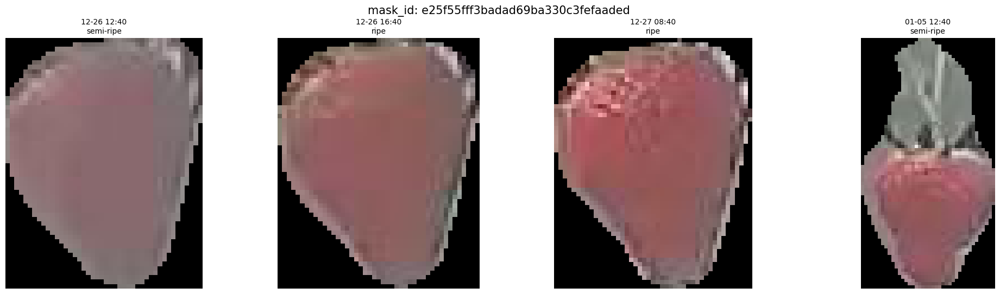

mask_id: 668120929436a018fdb1b3f3e1f1dc06


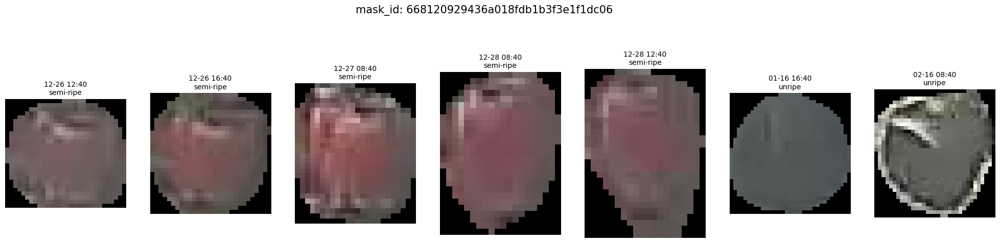

mask_id: e08ae200d8f959087dc1463aaff07869


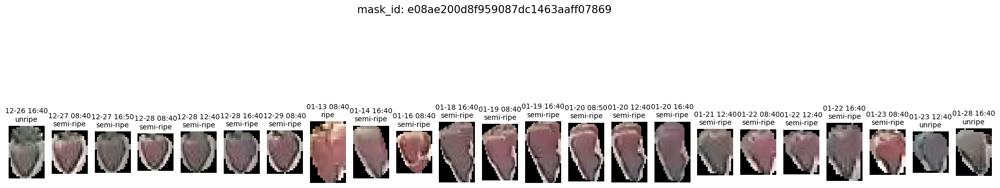

mask_id: e1465af7b9f86c80742ddf75989dcdb8


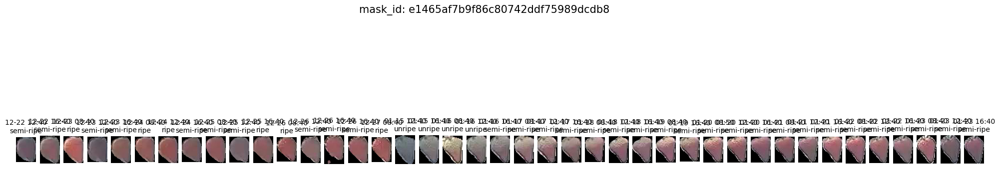

mask_id: 58c1b10b228724cc54d483e9a93e7a5b


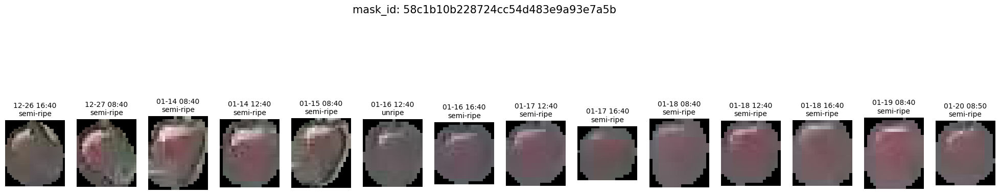

In [17]:
# 주어진 mask_id들이 포함된 데이터 추출
filtered_data = FF0016_23_24_dec_to_feb[FF0016_23_24_dec_to_feb['mask_id'].isin(img_data_16_23_dec['mask_id'].unique())]

# mask_id별로 최신 날짜순으로 정렬하고 필요한 정보 저장
mask_info_list = []
for mask_id in img_data_16_23_dec['mask_id'].unique():
    mask_data = filtered_data[filtered_data['mask_id'] == mask_id]
    sorted_mask_data = mask_data.sort_values(by='check_datetime', ascending=True)
    mask_info_list.append(sorted_mask_data)

# 각 mask_id별로 시각화
for mask_info in mask_info_list:
    mask_id = mask_info['mask_id'].iloc[0]

    # 각 mask_id를 출력
    print("mask_id:", mask_id)
    
    # 각 mask_id별로 등장한 일자순으로 시각화
    fig, axes = plt.subplots(1, len(mask_info), figsize=(25, 6))
    fig.suptitle(f'mask_id: {mask_id}', fontsize=15)
    
    for i, (_, row) in enumerate(mask_info.iterrows()):
        img_path = "/home/ubuntu/drive/dataset/SAM_result/F0016/C101/" + row['input_image_name'] + "/masks/" + row["output_image_path"]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # 이미지와 관련 정보 시각화
        check_datetime_formatted = row["check_datetime"].strftime("%m-%d %H:%M")
        np.ravel(axes)[i].imshow(img)
        np.ravel(axes)[i].set_title(f'{check_datetime_formatted}\n{row["pred_growth"]}', fontsize=10)
        np.ravel(axes)[i].axis('off')

    plt.show()

In [18]:
F0016_period_23_24

,check_datetime,farm_code,area_code,input_image_name,input_image_path,before_img_name,img_id,count_masks,mask_num,mask_id,output_image_path,pred_growth
39979,2023-09-05 16:40:00,F0016,C101,F0016-C101-20230905-164021,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20230905-124018,1f6e34d4f8852097d854cc2820d786fe,1.0,F0016-C101-20230905-164021_1,07e4846542447d3dd9831ecd427e7917,image_mask_1.png,unripe
39980,2023-09-07 16:40:00,F0016,C101,F0016-C101-20230907-164022,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20230907-124024,70c3fed6f01a2924fdefb8ef1631dc37,2.0,F0016-C101-20230907-164022_1,a93d13c6b57f5f4bff6eb00a71fcca38,image_mask_1.png,unripe
39981,2023-09-07 16:40:00,F0016,C101,F0016-C101-20230907-164022,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20230907-124024,70c3fed6f01a2924fdefb8ef1631dc37,2.0,F0016-C101-20230907-164022_2,07e4846542447d3dd9831ecd427e7917,image_mask_2.png,unripe
39982,2023-09-08 08:40:00,F0016,C101,F0016-C101-20230908-084144,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20230907-164022,f79363949d47f6ca0116ff6c86090dbd,1.0,F0016-C101-20230908-084144_1,8e7814f8f1344084f2f5b2b35fdaf535,image_mask_1.png,unripe
39983,2023-09-08 16:40:00,F0016,C101,F0016-C101-20230908-164108,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20230908-124136,cc94fd024d80c4610ba8971b62431f19,1.0,F0016-C101-20230908-164108_1,07e4846542447d3dd9831ecd427e7917,image_mask_1.png,unripe
...,...,...,...,...,...,...,...,...,...,...,...,...
46062,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_5,dade7dd70597d7c1a73e70099c9eda42,image_mask_5.png,unripe
46063,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_6,4324212bf0c794ff90cd1276ee1d5621,image_mask_6.png,semi-ripe
46064,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_7,bad432cad0ff1b16f3e82ecae2708ad7,image_mask_7.png,semi-ripe
46065,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_8,f055a1592115fbd15c9be4bcb20eb97d,image_mask_8.png,semi-ripe


#### F0016 23-24 1월

In [19]:
# 1월 데이터만 선택하여 저장
F0016_23_24_jan = F0016_period_23_24[(F0016_period_23_24['check_datetime'].dt.month == 1) & (F0016_period_23_24['check_datetime'].dt.year == 2024)]
F0016_23_24_jan

#1월-3월 데이터 선택 
F0016_23_24_jan_to_mar = F0016_period_23_24[(F0016_period_23_24['check_datetime'].dt.month == 1) & (F0016_period_23_24['check_datetime'].dt.year == 2024) | (F0016_period_23_24['check_datetime'].dt.month == 3) & (F0016_period_23_24['check_datetime'].dt.year == 2024)]
F0016_23_24_jan_to_mar

,check_datetime,farm_code,area_code,input_image_name,input_image_path,before_img_name,img_id,count_masks,mask_num,mask_id,output_image_path,pred_growth
40662,2024-01-01 08:40:00,F0016,C101,F0016-C101-20240101-084449,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231231-164446,f9c3c6b92045cd972218b76fd03cda3d,37.0,F0016-C101-20240101-084449_1,ce53434749b761f60572916ad02be567,image_mask_1.png,semi-ripe
40663,2024-01-01 08:40:00,F0016,C101,F0016-C101-20240101-084449,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231231-164446,f9c3c6b92045cd972218b76fd03cda3d,37.0,F0016-C101-20240101-084449_10,ee56996c752f1212c63d7e258e74dff9,image_mask_10.png,semi-ripe
40664,2024-01-01 08:40:00,F0016,C101,F0016-C101-20240101-084449,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231231-164446,f9c3c6b92045cd972218b76fd03cda3d,37.0,F0016-C101-20240101-084449_11,67539e9510d64f576b78139d39cccce6,image_mask_11.png,semi-ripe
40665,2024-01-01 08:40:00,F0016,C101,F0016-C101-20240101-084449,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231231-164446,f9c3c6b92045cd972218b76fd03cda3d,37.0,F0016-C101-20240101-084449_12,f2a91f5c90fa9a65da1c821bfdb99e3d,image_mask_12.png,semi-ripe
40666,2024-01-01 08:40:00,F0016,C101,F0016-C101-20240101-084449,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20231231-164446,f9c3c6b92045cd972218b76fd03cda3d,37.0,F0016-C101-20240101-084449_13,3e58cc6f1bffd4ca8412fea2931c5bf6,image_mask_13.png,semi-ripe
...,...,...,...,...,...,...,...,...,...,...,...,...
46062,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_5,dade7dd70597d7c1a73e70099c9eda42,image_mask_5.png,unripe
46063,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_6,4324212bf0c794ff90cd1276ee1d5621,image_mask_6.png,semi-ripe
46064,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_7,bad432cad0ff1b16f3e82ecae2708ad7,image_mask_7.png,semi-ripe
46065,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_8,f055a1592115fbd15c9be4bcb20eb97d,image_mask_8.png,semi-ripe


In [20]:
# img_id별 mask_id 개수 계산
img_id_mask_count = F0016_23_24_jan.groupby('img_id')['mask_id'].count().reset_index()
print(img_id_mask_count.sort_values(by='mask_id', ascending=False))

                              img_id  mask_id
33  5d01539f1b2e8f0c9631e88c88056ffc       55
1   09992560dc60a53ba9793346e85c821c       51
80  d034a6d9c94b1b32e82e473fb33ef8ea       51
58  a38d14a0a0bebfa90a874db29bc2bcda       47
8   20ed0176d97981a6877d47cf8fd01e33       47
..                               ...      ...
27  4c526d9a846803db60ebc5446912ea34       11
41  6dee48cdc827c2aa9bcb9d1ef137cc1f        9
92  fd4cdc95b3a1af3374f1ad58ef51daa1        9
44  7893883ad2e50f281030377c32726dab        6
4   17eb67a4b14cd1be56fa83468f80b64d        6

[93 rows x 2 columns]


In [21]:
F0016_23_24_jan[F0016_23_24_jan['img_id'] == '09992560dc60a53ba9793346e85c821c']

,check_datetime,farm_code,area_code,input_image_name,input_image_path,before_img_name,img_id,count_masks,mask_num,mask_id,output_image_path,pred_growth
41251,2024-01-07 08:40:00,F0016,C101,F0016-C101-20240107-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240106-164449,09992560dc60a53ba9793346e85c821c,51.0,F0016-C101-20240107-084446_1,2babb793c3bf1581c95a9ae3a652f343,image_mask_1.png,semi-ripe
41252,2024-01-07 08:40:00,F0016,C101,F0016-C101-20240107-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240106-164449,09992560dc60a53ba9793346e85c821c,51.0,F0016-C101-20240107-084446_10,c3b7c2e15b13cb19377cb83fdd5065b8,image_mask_10.png,semi-ripe
41253,2024-01-07 08:40:00,F0016,C101,F0016-C101-20240107-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240106-164449,09992560dc60a53ba9793346e85c821c,51.0,F0016-C101-20240107-084446_11,24483e0a3d4161ad857b60fa1278f4af,image_mask_11.png,ripe
41254,2024-01-07 08:40:00,F0016,C101,F0016-C101-20240107-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240106-164449,09992560dc60a53ba9793346e85c821c,51.0,F0016-C101-20240107-084446_12,edea32cc72e20e952adfb257a667b1cb,image_mask_12.png,semi-ripe
41255,2024-01-07 08:40:00,F0016,C101,F0016-C101-20240107-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240106-164449,09992560dc60a53ba9793346e85c821c,51.0,F0016-C101-20240107-084446_13,4f3d7bc4e0ed86ca52f5fb40fb208644,image_mask_13.png,semi-ripe
41256,2024-01-07 08:40:00,F0016,C101,F0016-C101-20240107-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240106-164449,09992560dc60a53ba9793346e85c821c,51.0,F0016-C101-20240107-084446_14,4324212bf0c794ff90cd1276ee1d5621,image_mask_14.png,semi-ripe
41257,2024-01-07 08:40:00,F0016,C101,F0016-C101-20240107-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240106-164449,09992560dc60a53ba9793346e85c821c,51.0,F0016-C101-20240107-084446_15,fbd5a41a368754cd076f200ccaacf644,image_mask_15.png,ripe
41258,2024-01-07 08:40:00,F0016,C101,F0016-C101-20240107-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240106-164449,09992560dc60a53ba9793346e85c821c,51.0,F0016-C101-20240107-084446_16,546d3dd454b5717fa342f91106605bc3,image_mask_16.png,semi-ripe
41259,2024-01-07 08:40:00,F0016,C101,F0016-C101-20240107-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240106-164449,09992560dc60a53ba9793346e85c821c,51.0,F0016-C101-20240107-084446_17,7f573d85095ba9dc09d270b08ba7f92a,image_mask_17.png,semi-ripe
41260,2024-01-07 08:40:00,F0016,C101,F0016-C101-20240107-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240106-164449,09992560dc60a53ba9793346e85c821c,51.0,F0016-C101-20240107-084446_18,adf7b0443d1076552ab71b91d1fa3f9b,image_mask_18.png,semi-ripe


In [22]:
# 'img_id'가 'ff35b4b9bc505daa988376c9f38b3b99'인 데이터에서 필요한 열만 선택
img_data_16_23_jan = F0016_23_24_jan[F0016_23_24_jan['img_id'] == '09992560dc60a53ba9793346e85c821c'][['check_datetime', 'input_image_name','output_image_path', 'pred_growth', 'mask_id']]

img_data_16_23_jan

,check_datetime,input_image_name,output_image_path,pred_growth,mask_id
41251,2024-01-07 08:40:00,F0016-C101-20240107-084446,image_mask_1.png,semi-ripe,2babb793c3bf1581c95a9ae3a652f343
41252,2024-01-07 08:40:00,F0016-C101-20240107-084446,image_mask_10.png,semi-ripe,c3b7c2e15b13cb19377cb83fdd5065b8
41253,2024-01-07 08:40:00,F0016-C101-20240107-084446,image_mask_11.png,ripe,24483e0a3d4161ad857b60fa1278f4af
41254,2024-01-07 08:40:00,F0016-C101-20240107-084446,image_mask_12.png,semi-ripe,edea32cc72e20e952adfb257a667b1cb
41255,2024-01-07 08:40:00,F0016-C101-20240107-084446,image_mask_13.png,semi-ripe,4f3d7bc4e0ed86ca52f5fb40fb208644
41256,2024-01-07 08:40:00,F0016-C101-20240107-084446,image_mask_14.png,semi-ripe,4324212bf0c794ff90cd1276ee1d5621
41257,2024-01-07 08:40:00,F0016-C101-20240107-084446,image_mask_15.png,ripe,fbd5a41a368754cd076f200ccaacf644
41258,2024-01-07 08:40:00,F0016-C101-20240107-084446,image_mask_16.png,semi-ripe,546d3dd454b5717fa342f91106605bc3
41259,2024-01-07 08:40:00,F0016-C101-20240107-084446,image_mask_17.png,semi-ripe,7f573d85095ba9dc09d270b08ba7f92a
41260,2024-01-07 08:40:00,F0016-C101-20240107-084446,image_mask_18.png,semi-ripe,adf7b0443d1076552ab71b91d1fa3f9b


mask_id: 2babb793c3bf1581c95a9ae3a652f343


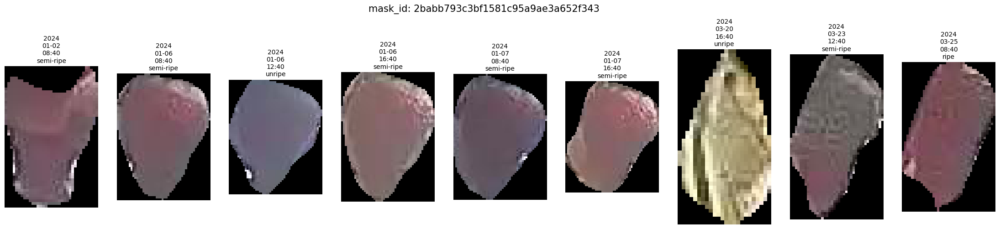

mask_id: c3b7c2e15b13cb19377cb83fdd5065b8


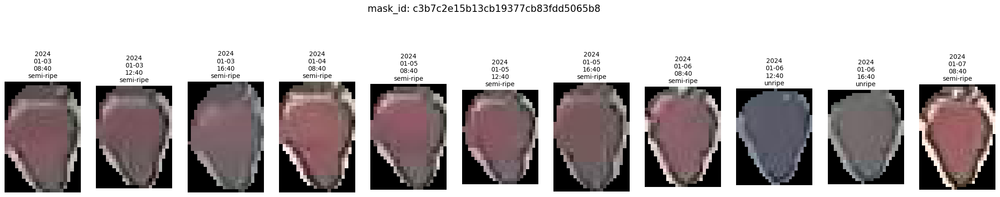

mask_id: 24483e0a3d4161ad857b60fa1278f4af


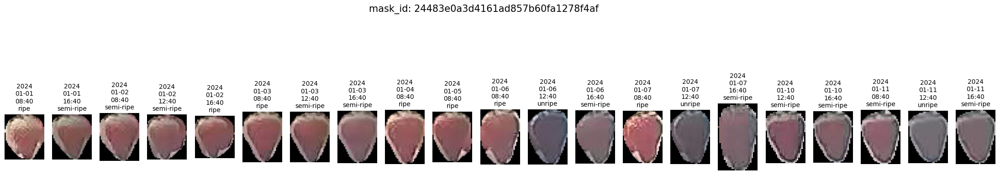

mask_id: edea32cc72e20e952adfb257a667b1cb


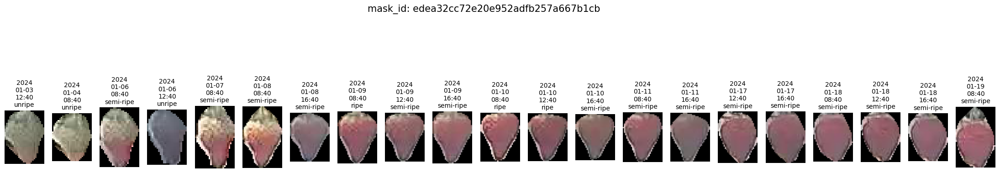

mask_id: 4f3d7bc4e0ed86ca52f5fb40fb208644


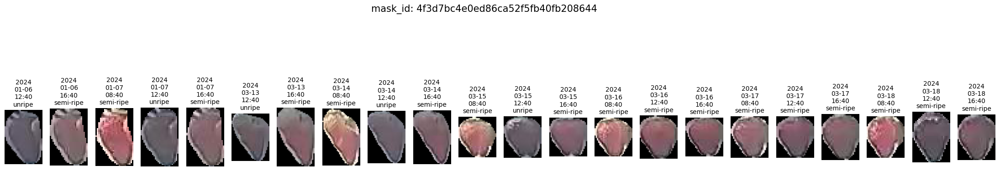

mask_id: 4324212bf0c794ff90cd1276ee1d5621


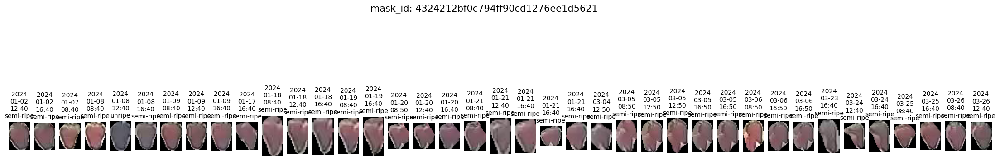

mask_id: fbd5a41a368754cd076f200ccaacf644


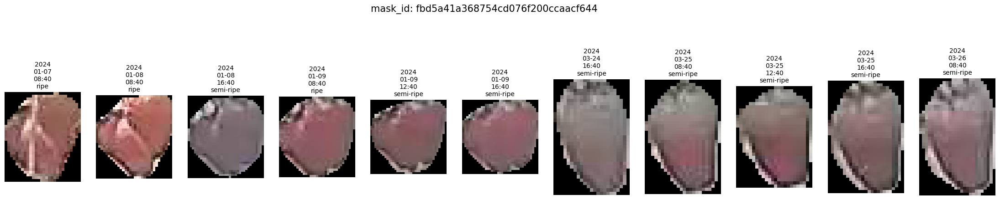

mask_id: 546d3dd454b5717fa342f91106605bc3


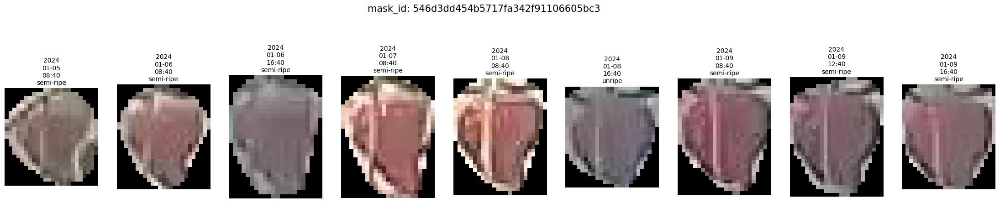

mask_id: 7f573d85095ba9dc09d270b08ba7f92a


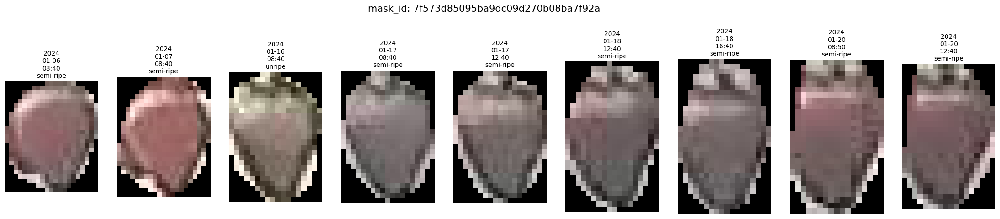

mask_id: adf7b0443d1076552ab71b91d1fa3f9b


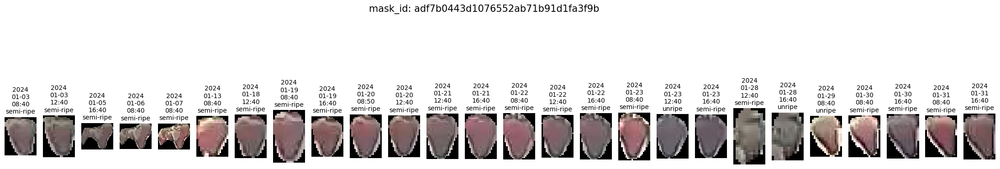

mask_id: 3e58cc6f1bffd4ca8412fea2931c5bf6


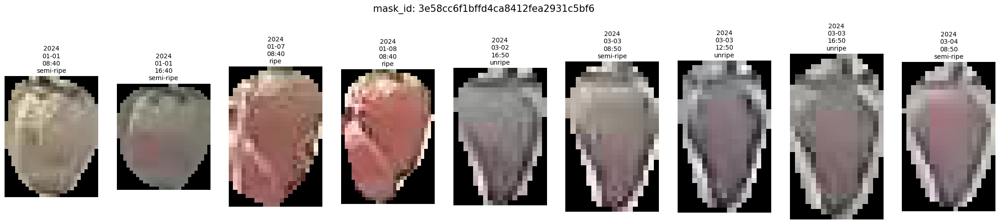

mask_id: 7155cbbddc72169b0cf611d46bc27ada


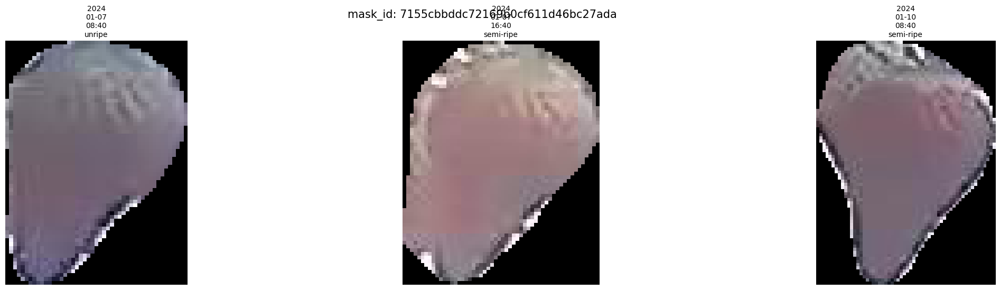

mask_id: a6a5ce37524cd6b37726d007ec3c04ad


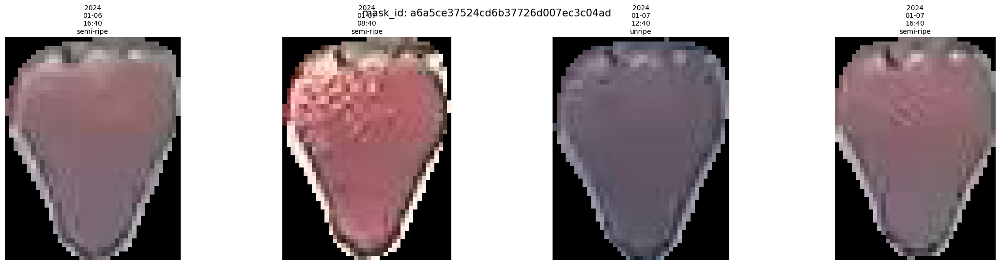

mask_id: b2055147f4b064517d043ed814cb8b50


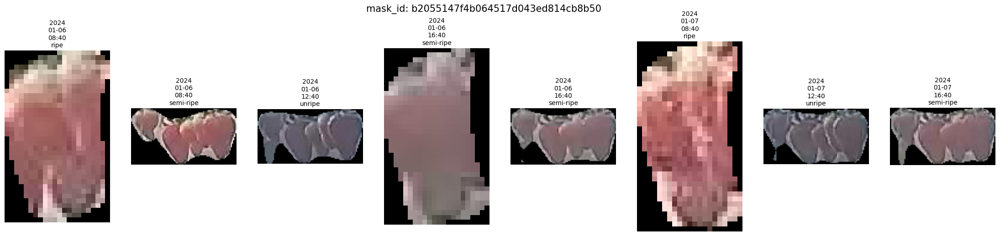

mask_id: a3bb266eeb335ff265d8d464f7387911


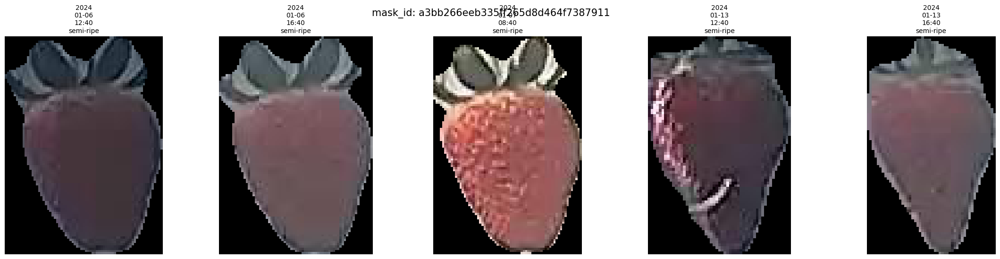

mask_id: 066a1eef4d781f0b47e6f737f606c6ac


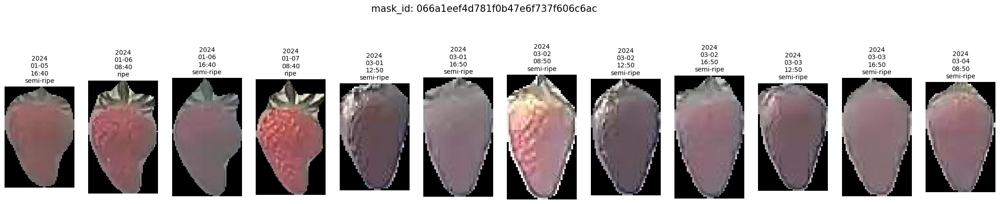

mask_id: 0e21423f54dc74352cec9aa0e6e33ca6


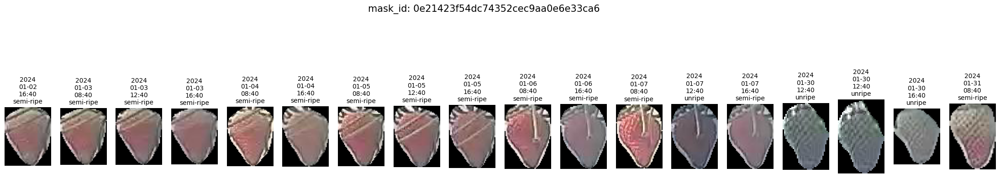

mask_id: 3fb79a2ee117a7c75a35a9ccfbe09358


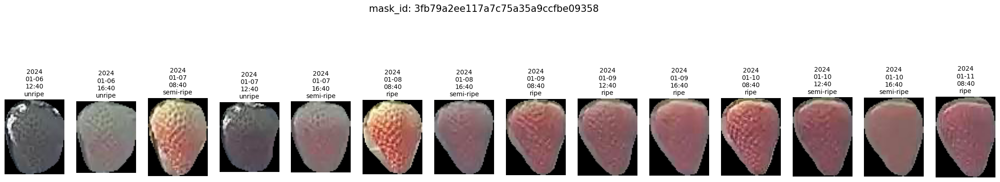

mask_id: 1b97772156a151b10e0b0e54b37048e2


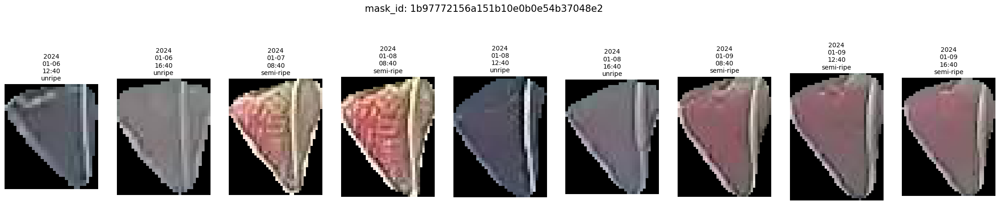

mask_id: 067a480b75ed924d81d916362997bbfa


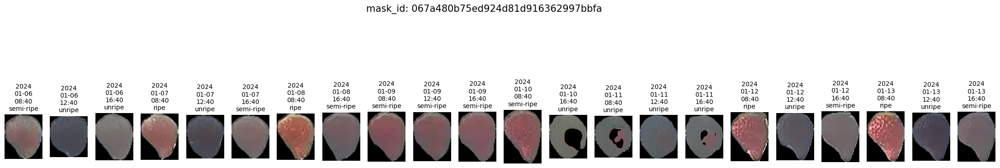

mask_id: 108b119c834536c97e2178faf87c2073


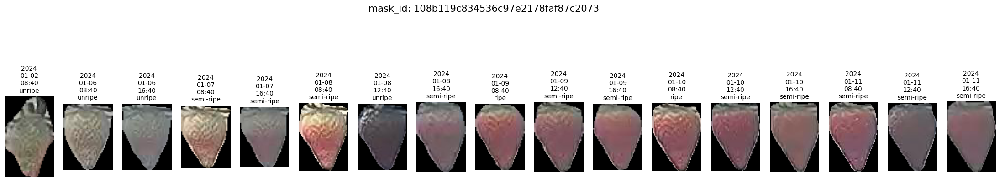

mask_id: 3fb904833779fe18dfbac952be9e56b2


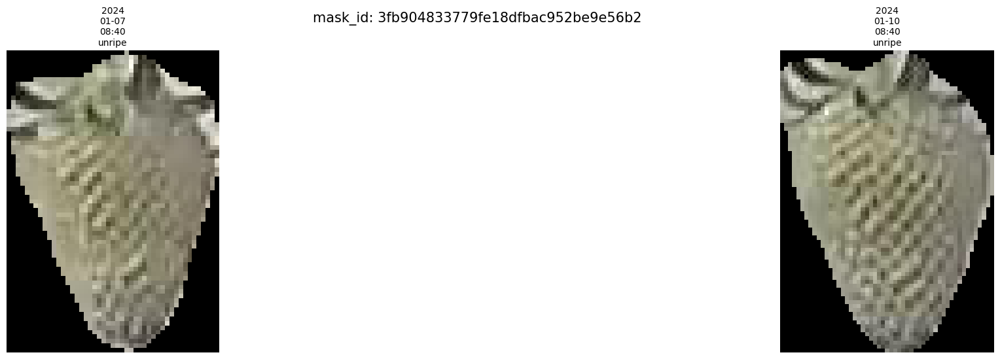

mask_id: c660ffe4d2fe6acfdcd37ea945b65e9a


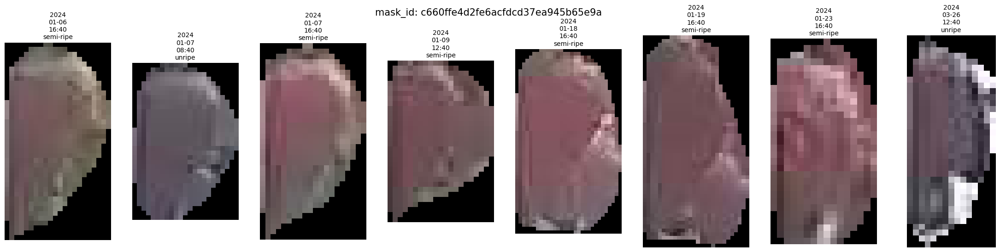

mask_id: 1475f254495a032596db1a683799e1cd


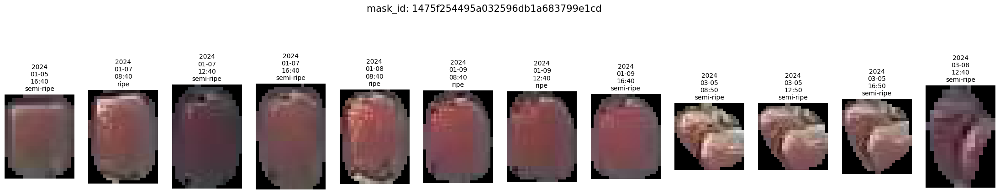

mask_id: 240987c5ebae69d2da4ff97b7bbf6d7c


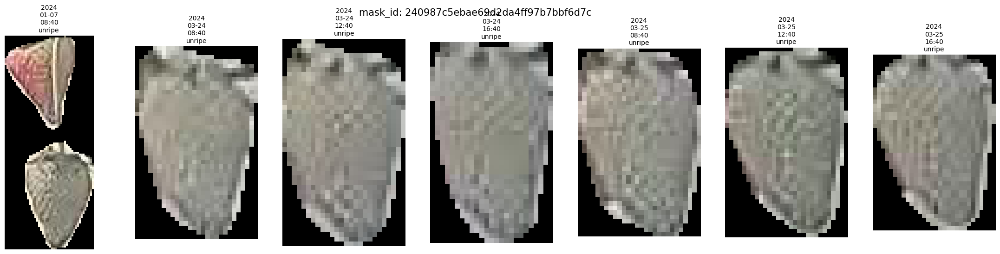

mask_id: 50626992ff46f5baa8620c12d2232212


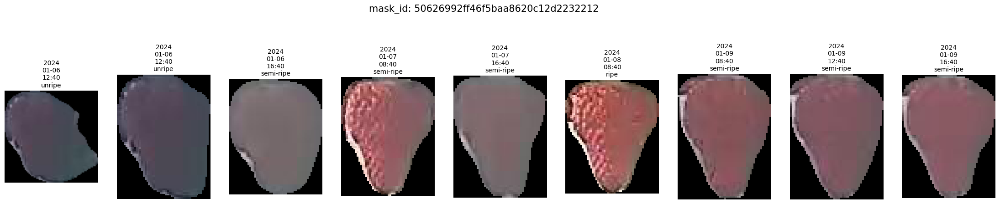

mask_id: 1c5c98d9b32768785862b9df4f7350c2


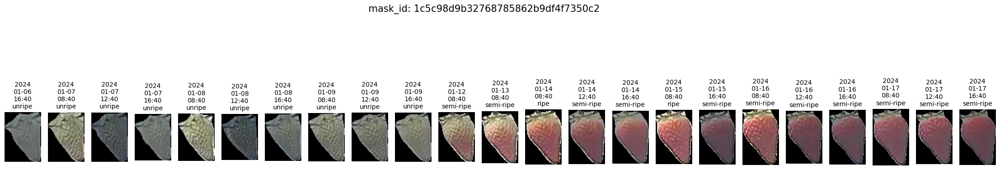

mask_id: 34fd43d90a031f9c23cd44029d2662fd


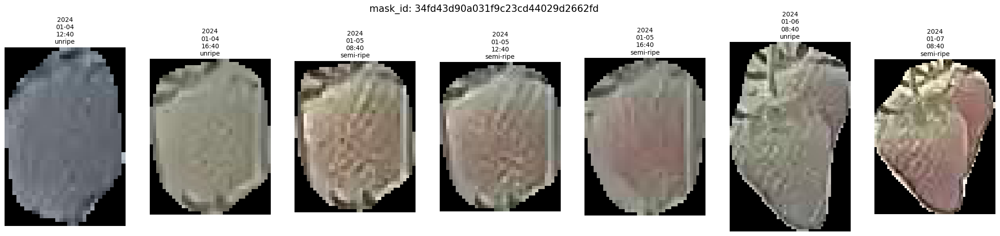

mask_id: 9ccae62fbe2cc91654a7f17b0068ed6f


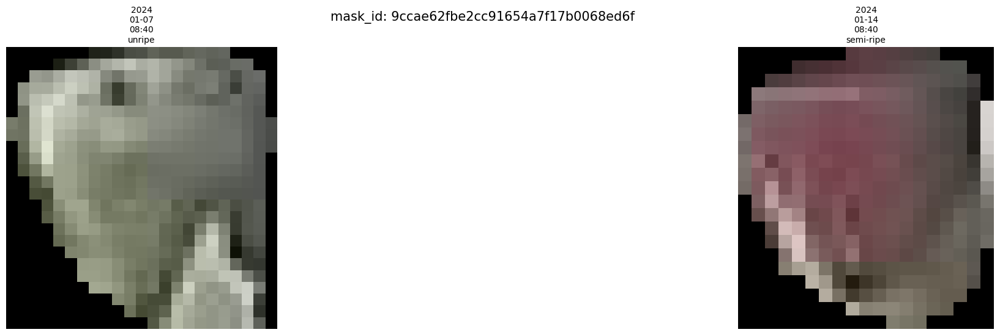

mask_id: 2d598692fbcb925df8133e6ffa8e8b29


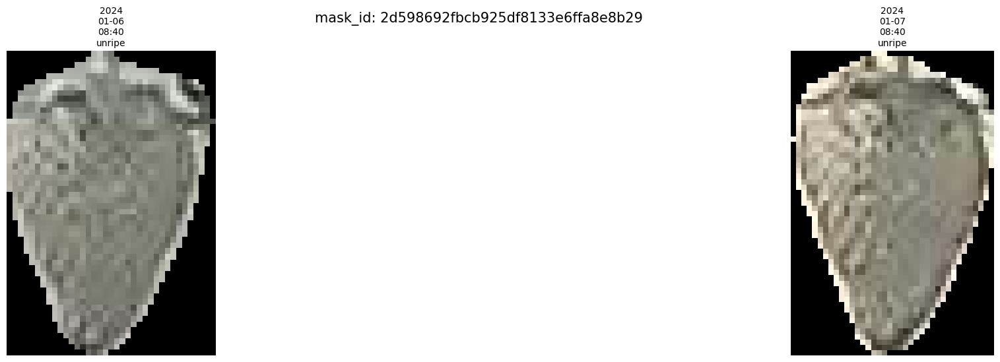

mask_id: e6843c9167ed852adffd907e57cbfa32


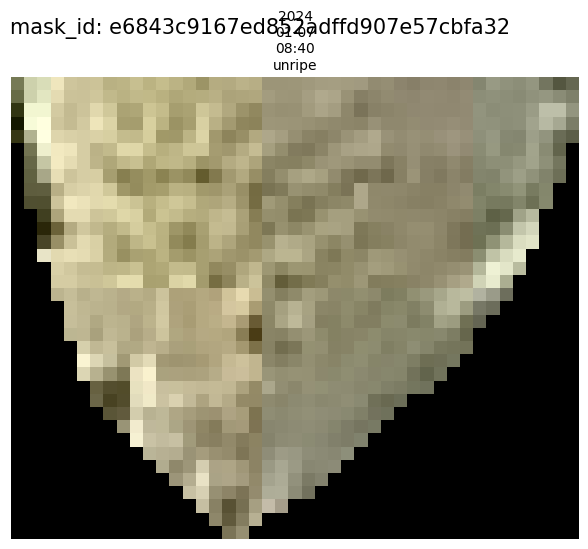

mask_id: 4b7d3742a81f779f18a3c4c6c914ead2


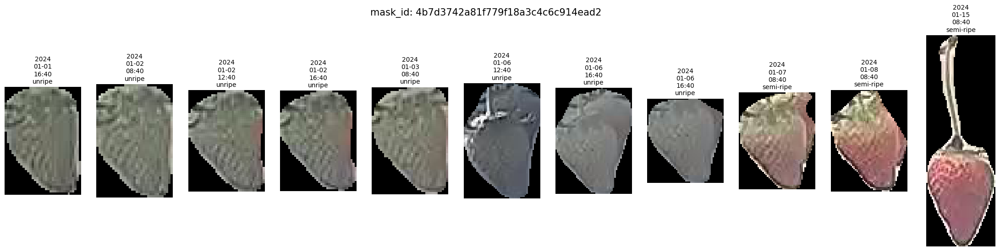

mask_id: 83bc0771a2f8438419e8dae0e545c8b6


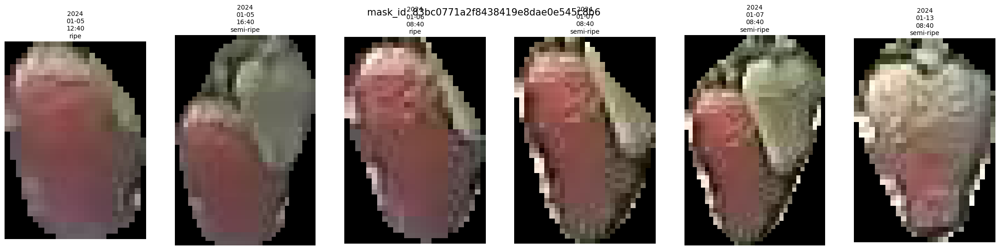

mask_id: 35a684ec77418d112c1287266d6a7b6e


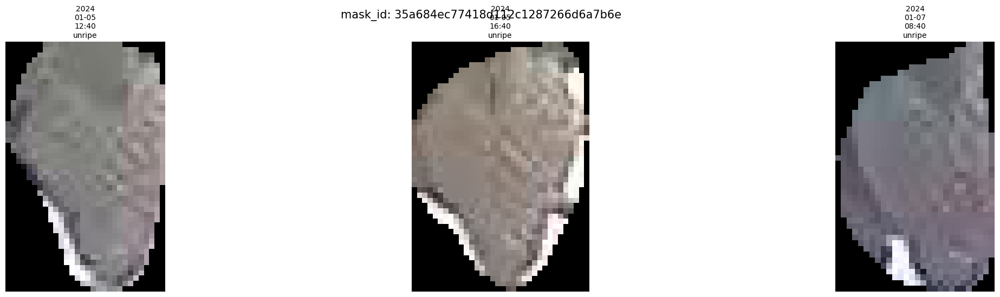

mask_id: e1366ca37c7c422a21b1b69c10df2634


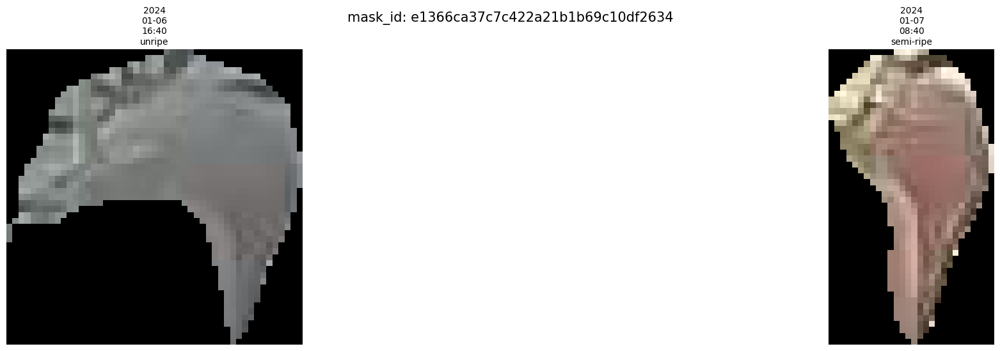

mask_id: 1a644a40cf483330a7825a2410137fdf


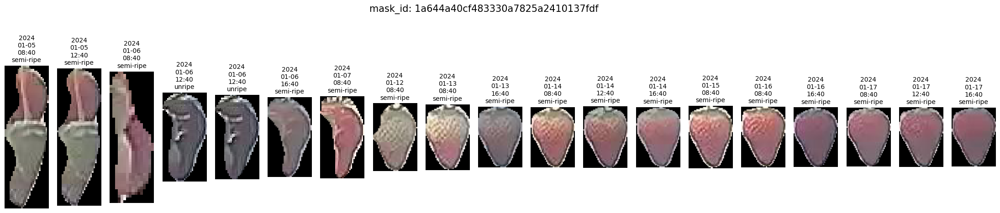

mask_id: e4e10e9bae3e82e5d40be9f890f1d221


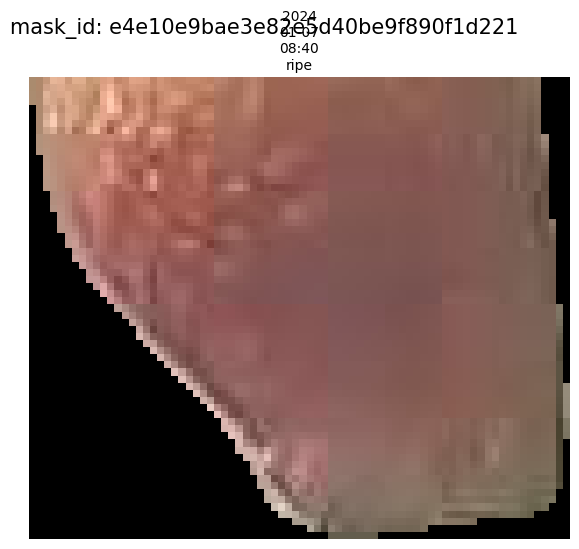

mask_id: a13a4f14c89b619cc0da00f51702e11e


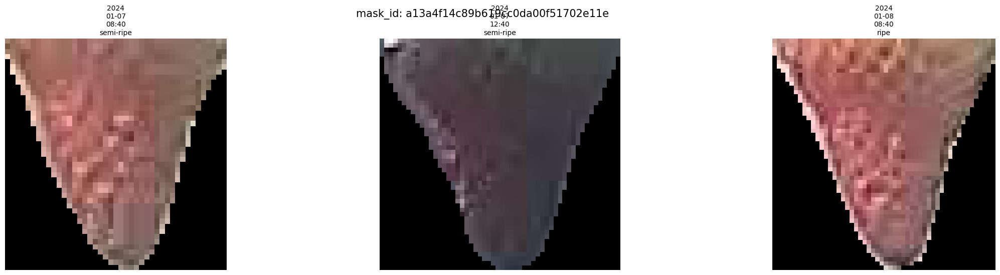

mask_id: 4f26e1dd322ebb1e96de429b5ab16822


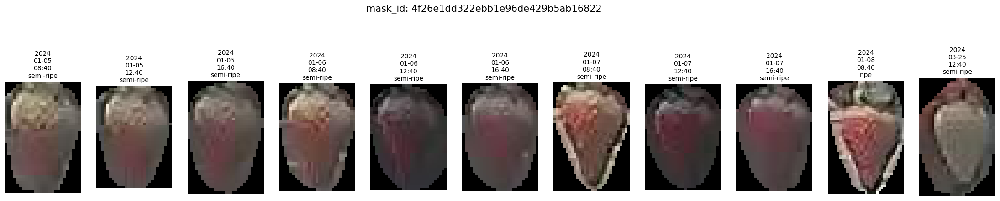

mask_id: 266213256a193e624ab90231efb48693


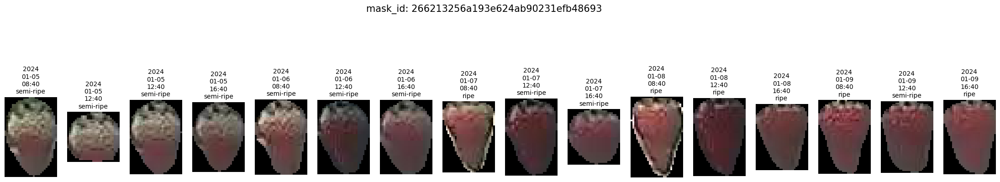

mask_id: 2edbfd7e6b21613b8b7bcb102d19bc74


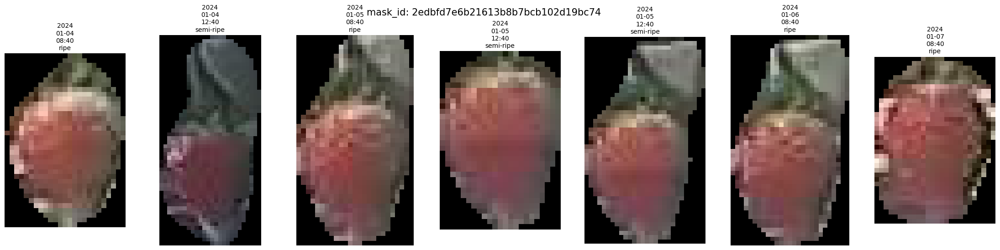

mask_id: 15fbe9891010fd0803984265cb3cdb91


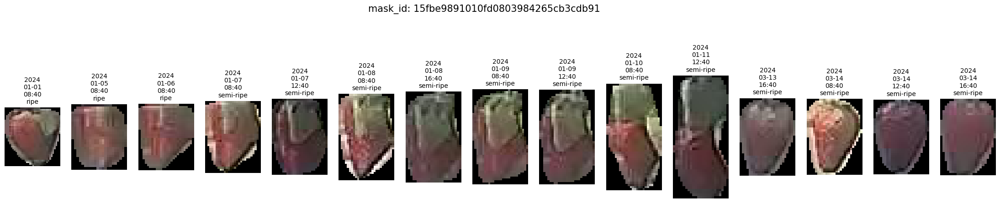

mask_id: ecbf6ddac6e53541e0ae021a7d0c2100


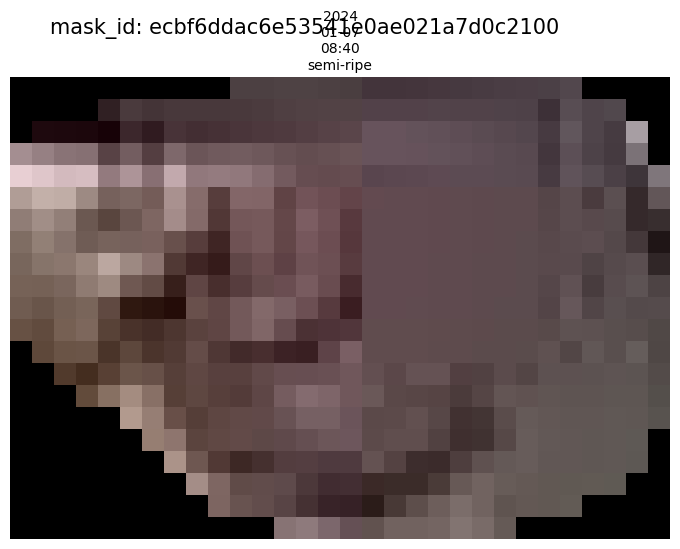

mask_id: 50398c67658de31585564db8871709ac


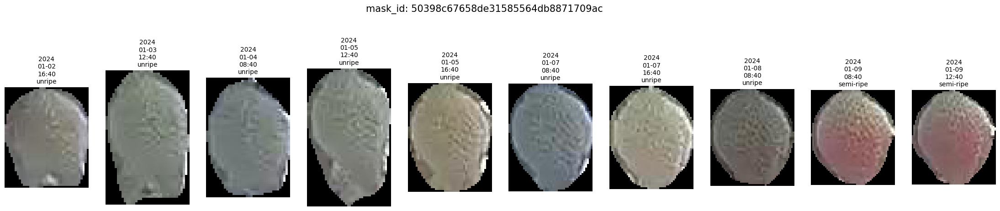

mask_id: 2ddd145cc40e8f8a61e4abbc0a4ed3cf


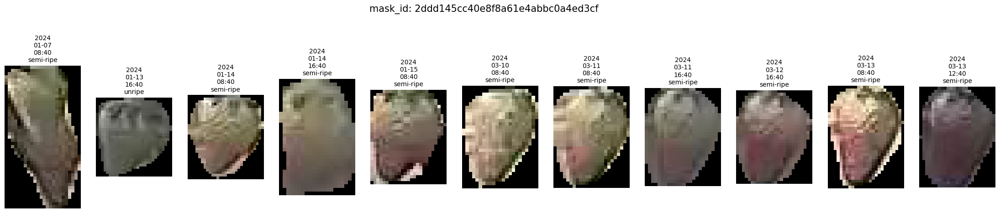

mask_id: 6bf2c3db86b612a5cdeae4d3535fc303


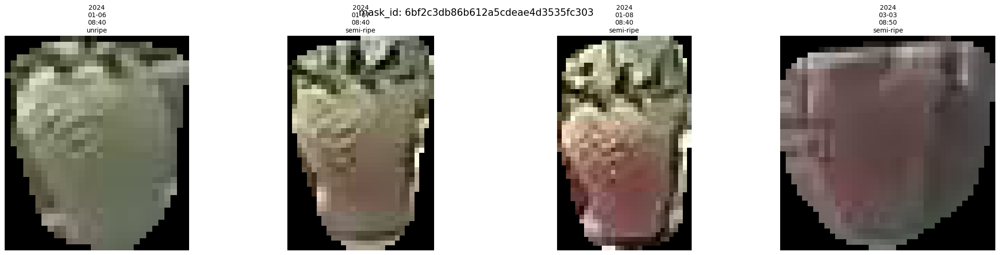

mask_id: 4e313676bb21f4d18b2c5e8e46e041db


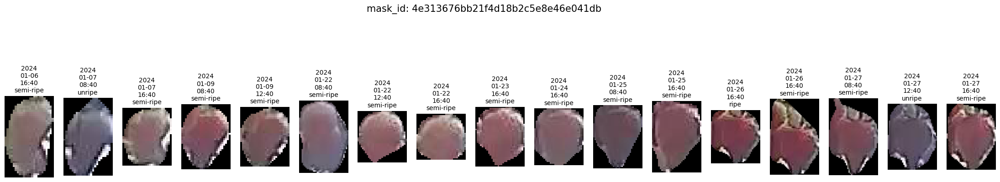

mask_id: de14c37985864fc4c010d2f2a20d9e4a


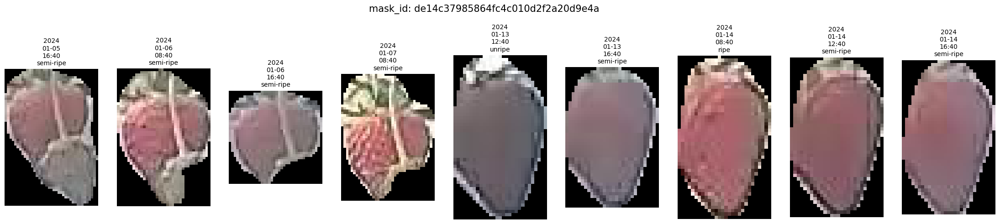

mask_id: 365faac6c90d5b2c94bb437929e422a2


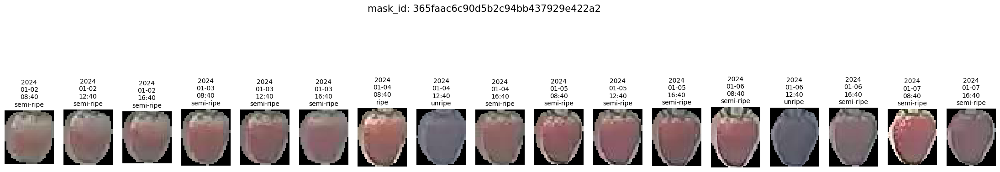

mask_id: 57b2cac3d604c10bbfeb3e93602cbddb


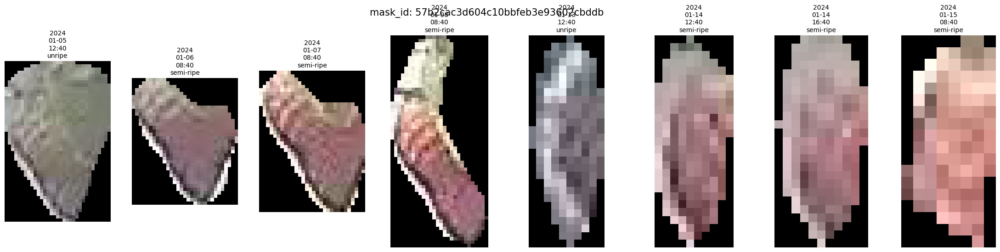

In [23]:
# 주어진 mask_id들이 포함된 데이터 추출
filtered_data = F0016_23_24_jan_to_mar[F0016_23_24_jan_to_mar['mask_id'].isin(img_data_16_23_jan['mask_id'].unique())]

# mask_id별로 최신 날짜순으로 정렬하고 필요한 정보 저장
mask_info_list = []
for mask_id in img_data_16_23_jan['mask_id'].unique():
    mask_data = filtered_data[filtered_data['mask_id'] == mask_id]
    sorted_mask_data = mask_data.sort_values(by='check_datetime', ascending=True)
    mask_info_list.append(sorted_mask_data)

# 각 mask_id별로 시각화
for mask_info in mask_info_list:
    mask_id = mask_info['mask_id'].iloc[0]

    # 각 mask_id를 출력
    print("mask_id:", mask_id)
    
    # 각 mask_id별로 등장한 일자순으로 시각화
    fig, axes = plt.subplots(1, len(mask_info), figsize=(28, 6))
    fig.suptitle(f'mask_id: {mask_id}', fontsize=15)
    
    for i, (_, row) in enumerate(mask_info.iterrows()):
        img_path = "/home/ubuntu/drive/dataset/SAM_result/F0016/C101/" + row['input_image_name'] + "/masks/" + row["output_image_path"]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # 이미지와 관련 정보 시각화
        check_datetime_formatted_year = row["check_datetime"].strftime("%Y")
        check_datetime_formatted_day = row["check_datetime"].strftime("%m-%d")
        check_datetime_formatted = row["check_datetime"].strftime("%H:%M")
        pred_growth = row["pred_growth"]
        title = f'{check_datetime_formatted_year}\n{check_datetime_formatted_day}\n{check_datetime_formatted}\n{pred_growth}'
        np.ravel(axes)[i].imshow(img)
        np.ravel(axes)[i].set_title(title, fontsize=10)
        np.ravel(axes)[i].axis('off')

    plt.show()

#### F0016 22-23작기 2월 

In [24]:
# 2월 데이터만 선택하여 저장
F0016_23_24_feb = F0016_period_23_24[(F0016_period_23_24['check_datetime'].dt.month == 2) & (F0016_period_23_24['check_datetime'].dt.year == 2024)]
F0016_23_24_feb

#2월-4월 데이터 선택 
F0016_23_24_feb_to_apr = F0016_period_23_24[(F0016_period_23_24['check_datetime'].dt.month == 2) & (F0016_period_23_24['check_datetime'].dt.year == 2024) | (F0016_period_23_24['check_datetime'].dt.month == 3) & (F0016_period_23_24['check_datetime'].dt.year == 2024)]
F0016_23_24_feb_to_apr

,check_datetime,farm_code,area_code,input_image_name,input_image_path,before_img_name,img_id,count_masks,mask_num,mask_id,output_image_path,pred_growth
43354,2024-02-01 08:40:00,F0016,C101,F0016-C101-20240201-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240131-164448,d31605b2235d3148635a749bf8e867f8,28.0,F0016-C101-20240201-084446_1,4596f92ffcf3bc6f91736aa1ae223487,image_mask_1.png,ripe
43355,2024-02-01 08:40:00,F0016,C101,F0016-C101-20240201-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240131-164448,d31605b2235d3148635a749bf8e867f8,28.0,F0016-C101-20240201-084446_10,2532b2f9c7979e69e973feb31ebdfa21,image_mask_10.png,semi-ripe
43356,2024-02-01 08:40:00,F0016,C101,F0016-C101-20240201-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240131-164448,d31605b2235d3148635a749bf8e867f8,28.0,F0016-C101-20240201-084446_11,45bd4465ff2cc18d55529a3cdc49fd2d,image_mask_11.png,semi-ripe
43357,2024-02-01 08:40:00,F0016,C101,F0016-C101-20240201-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240131-164448,d31605b2235d3148635a749bf8e867f8,28.0,F0016-C101-20240201-084446_12,0caeddc0597b3585582196eb3c4abdc5,image_mask_12.png,semi-ripe
43358,2024-02-01 08:40:00,F0016,C101,F0016-C101-20240201-084446,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240131-164448,d31605b2235d3148635a749bf8e867f8,28.0,F0016-C101-20240201-084446_13,b5becfaf45d963ff1f9c4a8d187dc11c,image_mask_13.png,semi-ripe
...,...,...,...,...,...,...,...,...,...,...,...,...
46062,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_5,dade7dd70597d7c1a73e70099c9eda42,image_mask_5.png,unripe
46063,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_6,4324212bf0c794ff90cd1276ee1d5621,image_mask_6.png,semi-ripe
46064,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_7,bad432cad0ff1b16f3e82ecae2708ad7,image_mask_7.png,semi-ripe
46065,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_8,f055a1592115fbd15c9be4bcb20eb97d,image_mask_8.png,semi-ripe


In [25]:
# img_id별 mask_id 개수 계산
img_id_mask_count = F0016_23_24_feb.groupby('img_id')['mask_id'].count().reset_index()
print(img_id_mask_count.sort_values(by='mask_id', ascending=False))

                              img_id  mask_id
45  837c84a8374575baa8f2c0e829f1b379       34
53  a324cba5707c63ae7c34ddd983394298       33
6   16f7619535b58db4b35f32a92e9d22a7       32
66  c306b7103b0697dae3684219528dda2c       30
37  700e2ebbc6eb60650f2fd5dacdbed3d1       30
..                               ...      ...
61  b569dede99fa2d31455f501809daa0f3        6
48  8c51431c11a66ac18d50ceafdc028df1        6
51  98a203961bc887b403066202caf9ce2f        6
16  34ed06d4b49a8a0245adbd897ef3259b        4
30  5563c92f05dc30f87de87c2dccb04e66        4

[85 rows x 2 columns]


In [26]:
F0016_23_24_feb[F0016_23_24_feb['img_id'] == '837c84a8374575baa8f2c0e829f1b379']

,check_datetime,farm_code,area_code,input_image_name,input_image_path,before_img_name,img_id,count_masks,mask_num,mask_id,output_image_path,pred_growth
44198,2024-02-19 12:40:00,F0016,C101,F0016-C101-20240219-124456,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240219-084446,837c84a8374575baa8f2c0e829f1b379,34.0,F0016-C101-20240219-124456_1,6ce61109e4f81f0f3039aee4f9fb70f6,image_mask_1.png,semi-ripe
44199,2024-02-19 12:40:00,F0016,C101,F0016-C101-20240219-124456,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240219-084446,837c84a8374575baa8f2c0e829f1b379,34.0,F0016-C101-20240219-124456_10,f58deaa8833cd8cc03bb7d365211dccc,image_mask_10.png,semi-ripe
44200,2024-02-19 12:40:00,F0016,C101,F0016-C101-20240219-124456,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240219-084446,837c84a8374575baa8f2c0e829f1b379,34.0,F0016-C101-20240219-124456_11,2300e09f2bc8f6e5768ebeb85b9486dc,image_mask_11.png,semi-ripe
44201,2024-02-19 12:40:00,F0016,C101,F0016-C101-20240219-124456,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240219-084446,837c84a8374575baa8f2c0e829f1b379,34.0,F0016-C101-20240219-124456_12,9e39f368fdeac0dc6e5cee7159b1c09b,image_mask_12.png,semi-ripe
44202,2024-02-19 12:40:00,F0016,C101,F0016-C101-20240219-124456,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240219-084446,837c84a8374575baa8f2c0e829f1b379,34.0,F0016-C101-20240219-124456_13,8939713ae3ac4888a6186d0a030bb7d2,image_mask_13.png,semi-ripe
44203,2024-02-19 12:40:00,F0016,C101,F0016-C101-20240219-124456,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240219-084446,837c84a8374575baa8f2c0e829f1b379,34.0,F0016-C101-20240219-124456_14,5d8a3db008e22a0b93cd05efc87c1822,image_mask_14.png,semi-ripe
44204,2024-02-19 12:40:00,F0016,C101,F0016-C101-20240219-124456,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240219-084446,837c84a8374575baa8f2c0e829f1b379,34.0,F0016-C101-20240219-124456_15,9764e21b1b85ca465de3e4f51caa05ee,image_mask_15.png,semi-ripe
44205,2024-02-19 12:40:00,F0016,C101,F0016-C101-20240219-124456,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240219-084446,837c84a8374575baa8f2c0e829f1b379,34.0,F0016-C101-20240219-124456_16,251edb01a8cc4656aad650b6bde49e5d,image_mask_16.png,semi-ripe
44206,2024-02-19 12:40:00,F0016,C101,F0016-C101-20240219-124456,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240219-084446,837c84a8374575baa8f2c0e829f1b379,34.0,F0016-C101-20240219-124456_17,c52164337fdbb68ae2917b66828d39ea,image_mask_17.png,semi-ripe
44207,2024-02-19 12:40:00,F0016,C101,F0016-C101-20240219-124456,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240219-084446,837c84a8374575baa8f2c0e829f1b379,34.0,F0016-C101-20240219-124456_18,88b49b8ad092b625817256f04ef83a27,image_mask_18.png,semi-ripe


In [27]:
# 'img_id'가 'ff35b4b9bc505daa988376c9f38b3b99'인 데이터에서 필요한 열만 선택
img_data_16_23_feb = F0016_23_24_feb[F0016_23_24_feb['img_id'] == '837c84a8374575baa8f2c0e829f1b379'][['check_datetime', 'input_image_name','output_image_path', 'pred_growth', 'mask_id']]

img_data_16_23_feb

,check_datetime,input_image_name,output_image_path,pred_growth,mask_id
44198,2024-02-19 12:40:00,F0016-C101-20240219-124456,image_mask_1.png,semi-ripe,6ce61109e4f81f0f3039aee4f9fb70f6
44199,2024-02-19 12:40:00,F0016-C101-20240219-124456,image_mask_10.png,semi-ripe,f58deaa8833cd8cc03bb7d365211dccc
44200,2024-02-19 12:40:00,F0016-C101-20240219-124456,image_mask_11.png,semi-ripe,2300e09f2bc8f6e5768ebeb85b9486dc
44201,2024-02-19 12:40:00,F0016-C101-20240219-124456,image_mask_12.png,semi-ripe,9e39f368fdeac0dc6e5cee7159b1c09b
44202,2024-02-19 12:40:00,F0016-C101-20240219-124456,image_mask_13.png,semi-ripe,8939713ae3ac4888a6186d0a030bb7d2
44203,2024-02-19 12:40:00,F0016-C101-20240219-124456,image_mask_14.png,semi-ripe,5d8a3db008e22a0b93cd05efc87c1822
44204,2024-02-19 12:40:00,F0016-C101-20240219-124456,image_mask_15.png,semi-ripe,9764e21b1b85ca465de3e4f51caa05ee
44205,2024-02-19 12:40:00,F0016-C101-20240219-124456,image_mask_16.png,semi-ripe,251edb01a8cc4656aad650b6bde49e5d
44206,2024-02-19 12:40:00,F0016-C101-20240219-124456,image_mask_17.png,semi-ripe,c52164337fdbb68ae2917b66828d39ea
44207,2024-02-19 12:40:00,F0016-C101-20240219-124456,image_mask_18.png,semi-ripe,88b49b8ad092b625817256f04ef83a27


mask_id: 6ce61109e4f81f0f3039aee4f9fb70f6


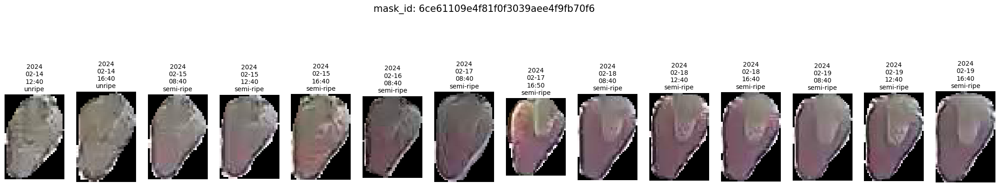

mask_id: f58deaa8833cd8cc03bb7d365211dccc


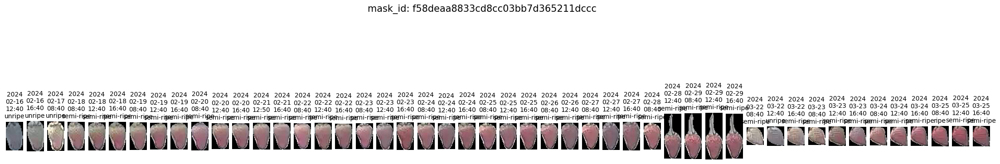

mask_id: 2300e09f2bc8f6e5768ebeb85b9486dc


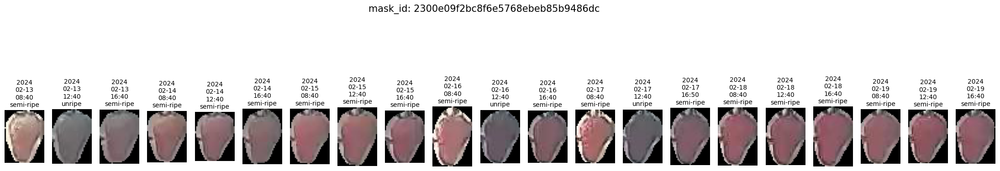

mask_id: 9e39f368fdeac0dc6e5cee7159b1c09b


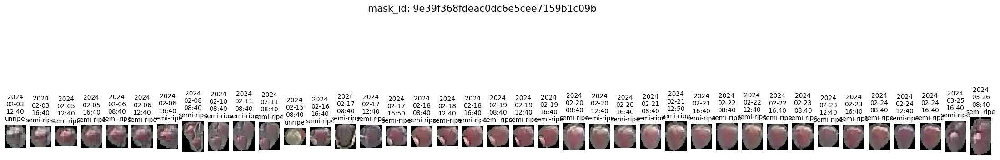

mask_id: 8939713ae3ac4888a6186d0a030bb7d2


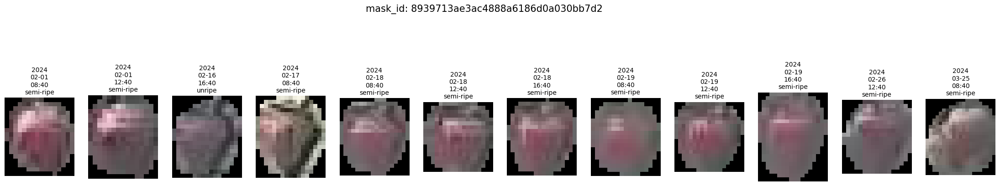

mask_id: 5d8a3db008e22a0b93cd05efc87c1822


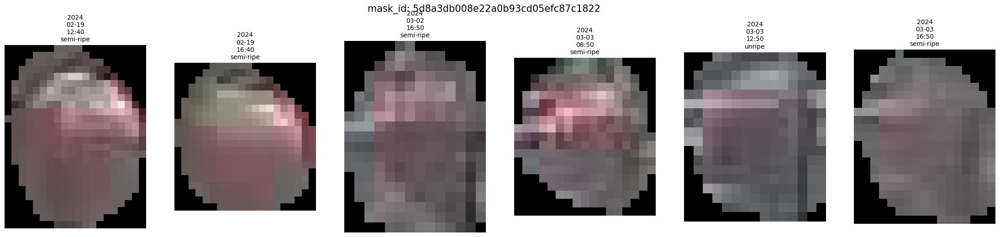

mask_id: 9764e21b1b85ca465de3e4f51caa05ee


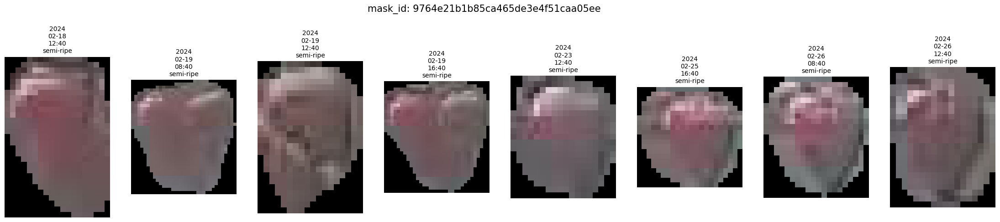

mask_id: 251edb01a8cc4656aad650b6bde49e5d


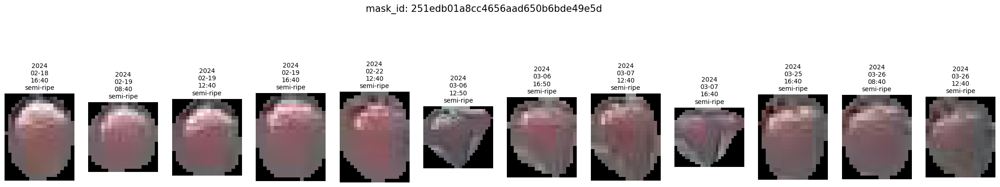

mask_id: c52164337fdbb68ae2917b66828d39ea


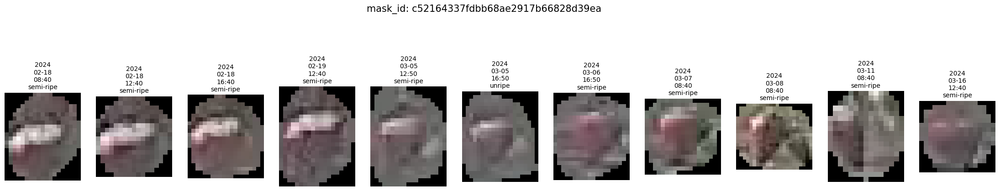

mask_id: 88b49b8ad092b625817256f04ef83a27


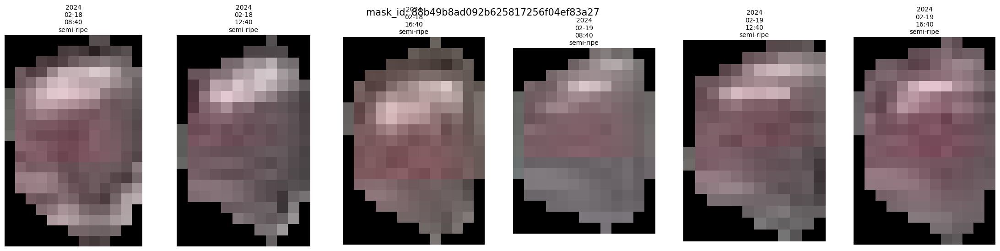

mask_id: a1471b14f541c4d0706c3160c17953e2


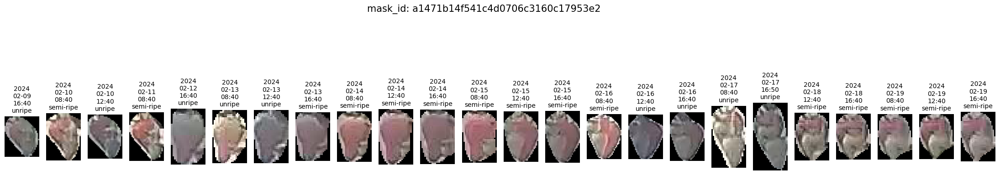

mask_id: 4afda4bdc1d5ff9cee61ad922ad07f14


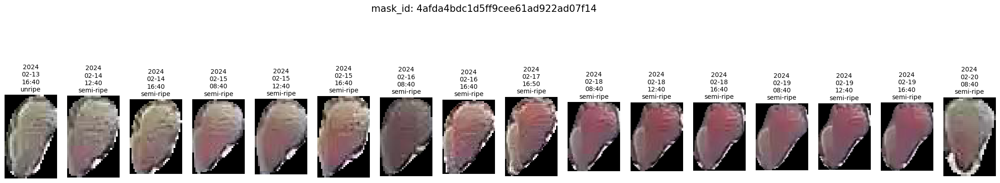

mask_id: 79475df40d1e18b13a8a2069bd0b43f5


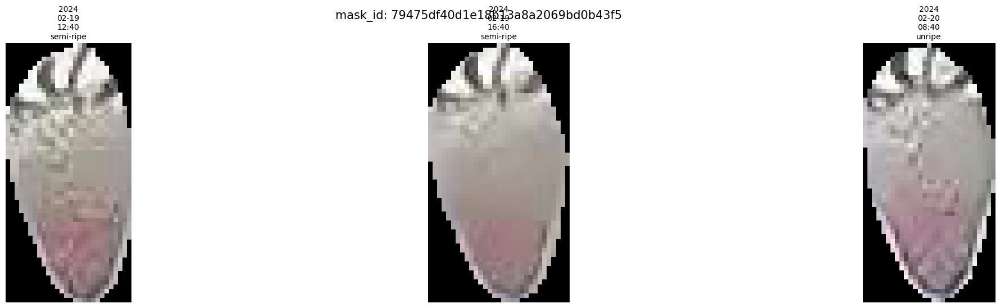

mask_id: e2a548af0d626ff8a366b98330a2c422


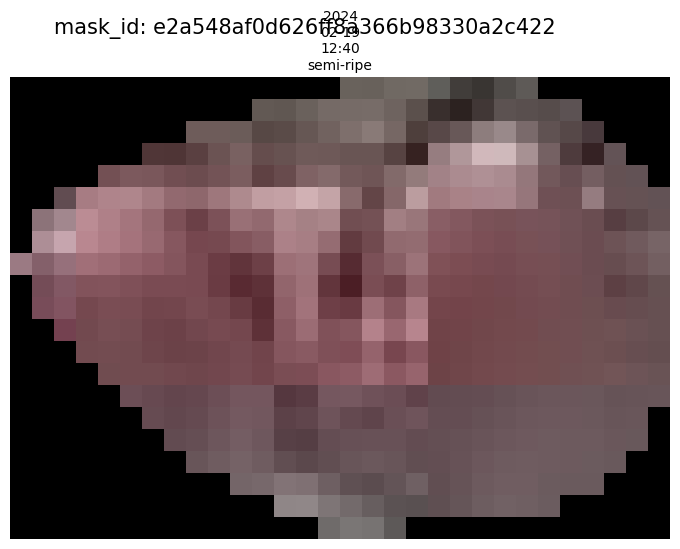

mask_id: c00b1df64a0016f4cd823d22b8de50b8


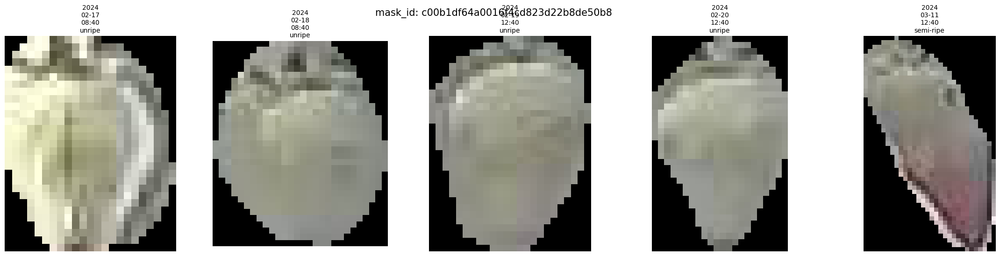

mask_id: 85ec66814aa33f0d339c34b874a1bd6b


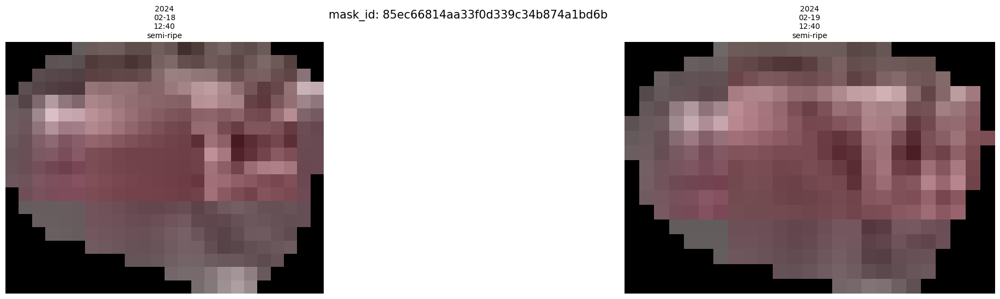

mask_id: 6eee8c999a39f8900dced0ad24ca6f29


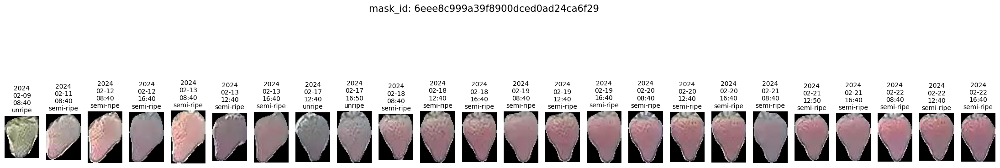

mask_id: dae87a9795fd9e3e63ab41bc9bf3f0c1


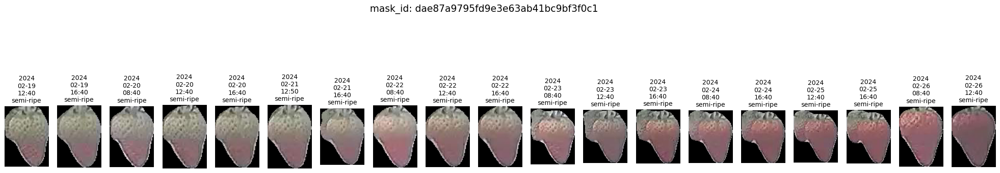

mask_id: 1970381ebfd2aa470b6fd58a3361e1da


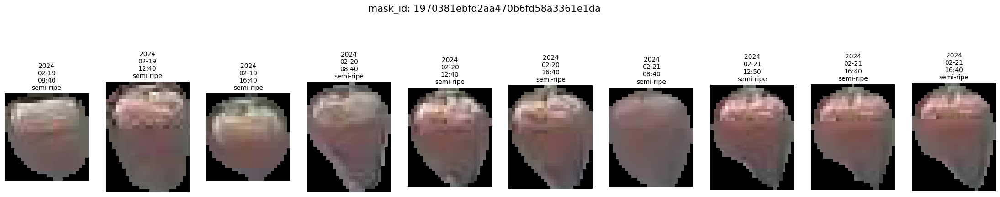

mask_id: b888f82df284a88b04384c16dae6c361


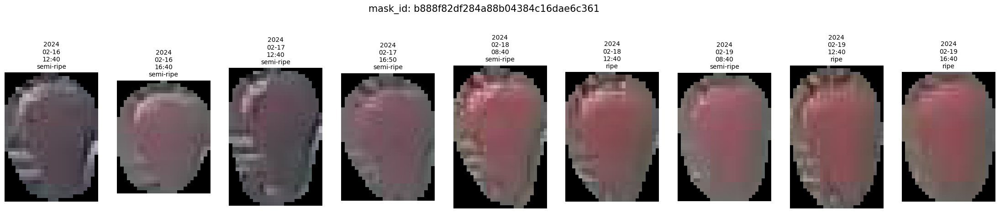

mask_id: 6845e41c46599c0caca7d0ddbd3186f1


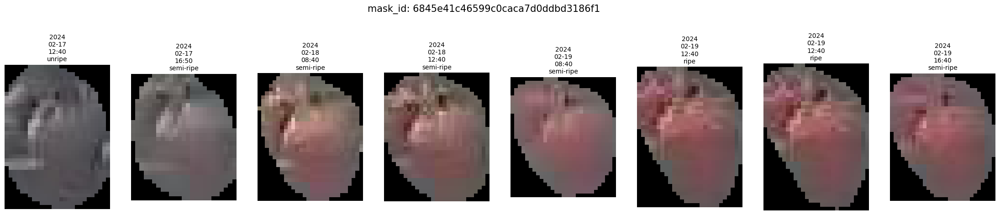

mask_id: 4f9e77a36bcb6dd5e5dd647a329131e4


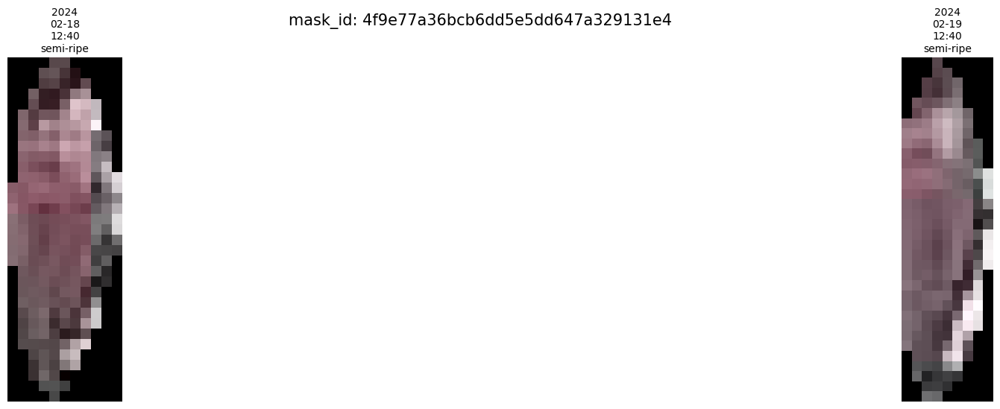

mask_id: f89564f162c84f128e439d946d9248a4


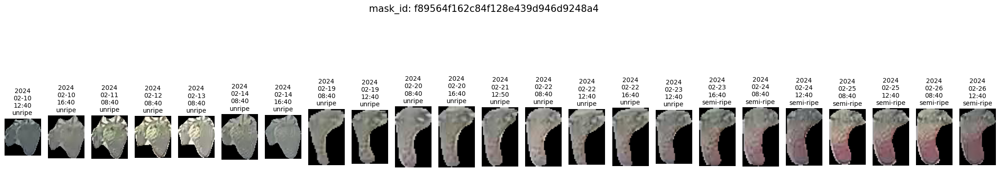

mask_id: e5ac43823d8a8f05917232f7fe462cfa


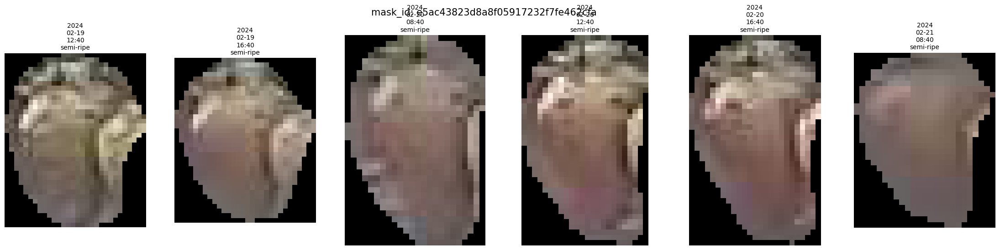

mask_id: 4199f4b772092bd60971273f81d5cd5b


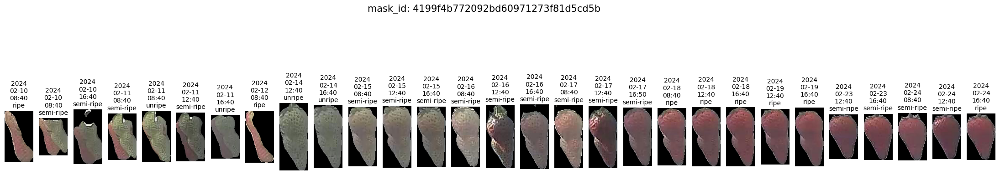

mask_id: aeeb00ba0490c7087179a57b92384218


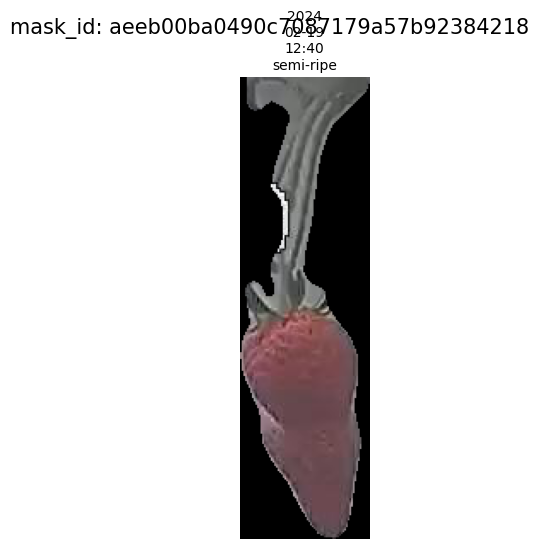

mask_id: c83b5ac7613f9a84b81e1f2cc3a6301c


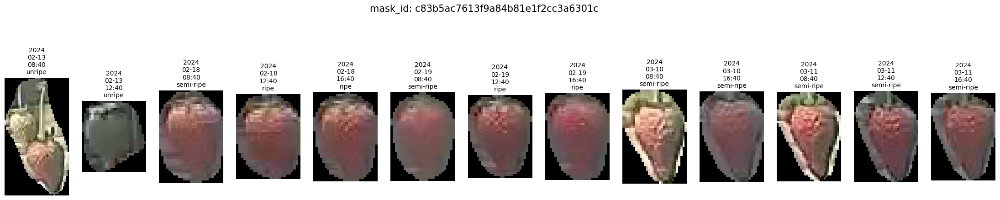

mask_id: 05db2357ee9a985104dd7dd8fd576bf1


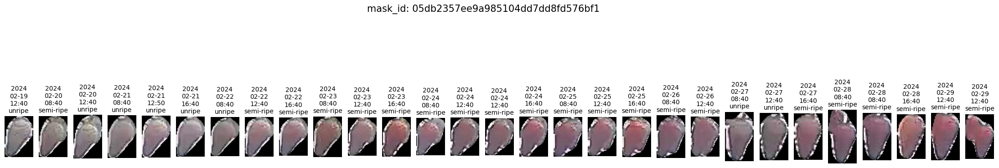

mask_id: bec8273482159df8969aa1267d3d27f6


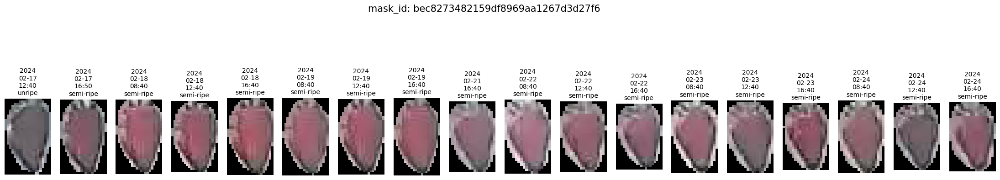

mask_id: f8c06bfcc14c30cfbebd7a01bb377460


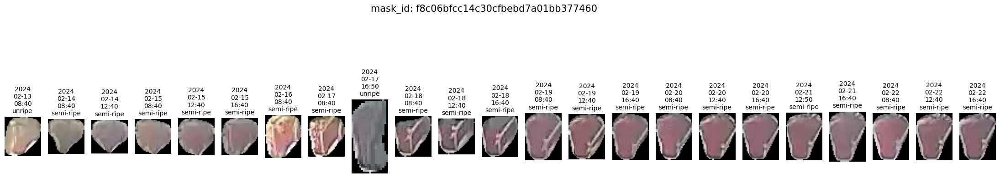

mask_id: 365faac6c90d5b2c94bb437929e422a2


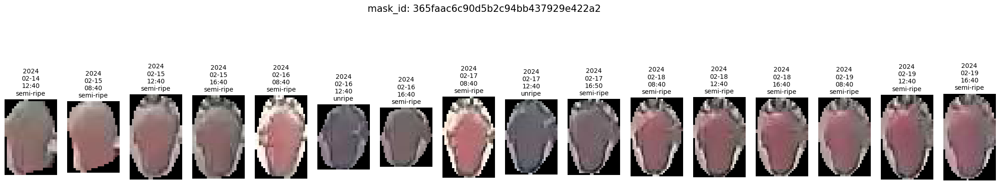

mask_id: 753bd595c07fae11e0f938338eceff56


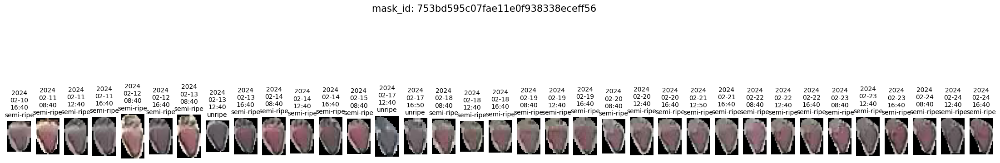

mask_id: 67bf37e69b08dac4cbc26df4cce78188


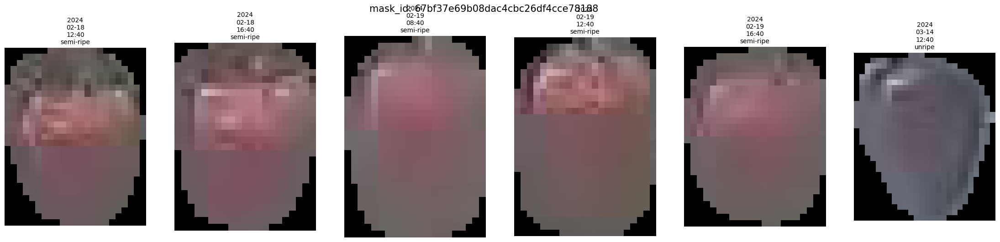

In [28]:
# 주어진 mask_id들이 포함된 데이터 추출
filtered_data = F0016_23_24_feb_to_apr[F0016_23_24_feb_to_apr['mask_id'].isin(img_data_16_23_feb['mask_id'].unique())]

# mask_id별로 최신 날짜순으로 정렬하고 필요한 정보 저장
mask_info_list = []
for mask_id in img_data_16_23_feb['mask_id'].unique():
    mask_data = filtered_data[filtered_data['mask_id'] == mask_id]
    sorted_mask_data = mask_data.sort_values(by='check_datetime', ascending=True)
    mask_info_list.append(sorted_mask_data)

# 각 mask_id별로 시각화
for mask_info in mask_info_list:
    mask_id = mask_info['mask_id'].iloc[0]

    # 각 mask_id를 출력
    print("mask_id:", mask_id)
    
    # 각 mask_id별로 등장한 일자순으로 시각화
    fig, axes = plt.subplots(1, len(mask_info), figsize=(28, 6))
    fig.suptitle(f'mask_id: {mask_id}', fontsize=15)
    
    for i, (_, row) in enumerate(mask_info.iterrows()):
        img_path = "/home/ubuntu/drive/dataset/SAM_result/F0016/C101/" + row['input_image_name'] + "/masks/" + row["output_image_path"]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # 이미지와 관련 정보 시각화
        check_datetime_formatted_year = row["check_datetime"].strftime("%Y")
        check_datetime_formatted_day = row["check_datetime"].strftime("%m-%d")
        check_datetime_formatted = row["check_datetime"].strftime("%H:%M")
        pred_growth = row["pred_growth"]
        title = f'{check_datetime_formatted_year}\n{check_datetime_formatted_day}\n{check_datetime_formatted}\n{pred_growth}'
        np.ravel(axes)[i].imshow(img)
        np.ravel(axes)[i].set_title(title, fontsize=10)
        np.ravel(axes)[i].axis('off')

    plt.show()

#### F0016 22-23 3월

In [29]:
# 3월 데이터만 선택하여 저장
F0016_23_24_mar = F0016_period_23_24[(F0016_period_23_24['check_datetime'].dt.month == 3) & (F0016_period_23_24['check_datetime'].dt.year == 2024)]
F0016_23_24_mar

#2월-4월 데이터 선택 
F0016_23_24_mar_to_apr = F0016_period_23_24[(F0016_period_23_24['check_datetime'].dt.month == 3) & (F0016_period_23_24['check_datetime'].dt.year == 2024) | (F0016_period_23_24['check_datetime'].dt.month == 4) & (F0016_period_23_24['check_datetime'].dt.year == 2024)]
F0016_23_24_mar_to_apr

,check_datetime,farm_code,area_code,input_image_name,input_image_path,before_img_name,img_id,count_masks,mask_num,mask_id,output_image_path,pred_growth
44797,2024-03-01 08:50:00,F0016,C101,F0016-C101-20240301-084637,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240229-164446,1ec5d5b69bcc55bef407e5facbce46e8,11.0,F0016-C101-20240301-084637_1,b4ea31f2fa8978c866be40944d1f6013,image_mask_1.png,semi-ripe
44798,2024-03-01 08:50:00,F0016,C101,F0016-C101-20240301-084637,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240229-164446,1ec5d5b69bcc55bef407e5facbce46e8,11.0,F0016-C101-20240301-084637_10,7ea64ddabc49c2a738a532857b8a6937,image_mask_10.png,semi-ripe
44799,2024-03-01 08:50:00,F0016,C101,F0016-C101-20240301-084637,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240229-164446,1ec5d5b69bcc55bef407e5facbce46e8,11.0,F0016-C101-20240301-084637_11,972b6777a75883e4c0dd30446b6b5adc,image_mask_11.png,unripe
44800,2024-03-01 08:50:00,F0016,C101,F0016-C101-20240301-084637,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240229-164446,1ec5d5b69bcc55bef407e5facbce46e8,11.0,F0016-C101-20240301-084637_2,5e64f8a5e6c9c7c5fa3e1b66ad103595,image_mask_2.png,unripe
44801,2024-03-01 08:50:00,F0016,C101,F0016-C101-20240301-084637,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240229-164446,1ec5d5b69bcc55bef407e5facbce46e8,11.0,F0016-C101-20240301-084637_3,3810cf6112383a08a0090038fbb0ef52,image_mask_3.png,unripe
...,...,...,...,...,...,...,...,...,...,...,...,...
46062,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_5,dade7dd70597d7c1a73e70099c9eda42,image_mask_5.png,unripe
46063,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_6,4324212bf0c794ff90cd1276ee1d5621,image_mask_6.png,semi-ripe
46064,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_7,bad432cad0ff1b16f3e82ecae2708ad7,image_mask_7.png,semi-ripe
46065,2024-03-26 12:40:00,F0016,C101,F0016-C101-20240326-124239,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240326-084308,5d7cf35292fdab220628f318751f044f,28.0,F0016-C101-20240326-124239_8,f055a1592115fbd15c9be4bcb20eb97d,image_mask_8.png,semi-ripe


In [30]:
# img_id별 mask_id 개수 계산
img_id_mask_count = F0016_23_24_mar.groupby('img_id')['mask_id'].count().reset_index()
print(img_id_mask_count.sort_values(by='mask_id', ascending=False))

                              img_id  mask_id
13  3496b96d182842e759b7b87825363955       37
62  de13412fe927418de1f945253ef48953       37
44  b6baa6ef89a0e9745dc9e42b0cc7d4fd       36
67  e540e0fed05e340f2e4dcc9789a4f255       35
33  9f0056d1c2d49d8b59c95d69bad86f5e       33
..                               ...      ...
35  a29ff745d3109e9c260b6d1f55ebb71b        5
23  61a77f94241849c7a084e54fbe4532ea        5
3   0778becd69d53d5dc3361d0c4a0f6c4a        5
12  2fdf1f4171c357d21a08c7e778cb0cca        3
25  6925d45018008b9084e00e647d923a48        3

[76 rows x 2 columns]


In [31]:
F0016_23_24_mar[F0016_23_24_mar['img_id'] == 'de13412fe927418de1f945253ef48953']

,check_datetime,farm_code,area_code,input_image_name,input_image_path,before_img_name,img_id,count_masks,mask_num,mask_id,output_image_path,pred_growth
45969,2024-03-25 16:40:00,F0016,C101,F0016-C101-20240325-164259,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240325-124242,de13412fe927418de1f945253ef48953,37.0,F0016-C101-20240325-164259_1,fd1520f48e987168f98091f68d0c47f2,image_mask_1.png,semi-ripe
45970,2024-03-25 16:40:00,F0016,C101,F0016-C101-20240325-164259,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240325-124242,de13412fe927418de1f945253ef48953,37.0,F0016-C101-20240325-164259_10,f58deaa8833cd8cc03bb7d365211dccc,image_mask_10.png,semi-ripe
45971,2024-03-25 16:40:00,F0016,C101,F0016-C101-20240325-164259,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240325-124242,de13412fe927418de1f945253ef48953,37.0,F0016-C101-20240325-164259_11,fbd5a41a368754cd076f200ccaacf644,image_mask_11.png,semi-ripe
45972,2024-03-25 16:40:00,F0016,C101,F0016-C101-20240325-164259,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240325-124242,de13412fe927418de1f945253ef48953,37.0,F0016-C101-20240325-164259_12,1c911cd8ac065b1581d408d7fe7666cc,image_mask_12.png,semi-ripe
45973,2024-03-25 16:40:00,F0016,C101,F0016-C101-20240325-164259,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240325-124242,de13412fe927418de1f945253ef48953,37.0,F0016-C101-20240325-164259_13,bfad75f53ef82546301c9598058bfd7e,image_mask_13.png,semi-ripe
45974,2024-03-25 16:40:00,F0016,C101,F0016-C101-20240325-164259,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240325-124242,de13412fe927418de1f945253ef48953,37.0,F0016-C101-20240325-164259_14,f72f8095c6c411f070fe5c6b58c1f794,image_mask_14.png,semi-ripe
45975,2024-03-25 16:40:00,F0016,C101,F0016-C101-20240325-164259,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240325-124242,de13412fe927418de1f945253ef48953,37.0,F0016-C101-20240325-164259_15,4324212bf0c794ff90cd1276ee1d5621,image_mask_15.png,semi-ripe
45976,2024-03-25 16:40:00,F0016,C101,F0016-C101-20240325-164259,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240325-124242,de13412fe927418de1f945253ef48953,37.0,F0016-C101-20240325-164259_16,ba902b068d9a351df6bad4ed98a1f68f,image_mask_16.png,semi-ripe
45977,2024-03-25 16:40:00,F0016,C101,F0016-C101-20240325-164259,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240325-124242,de13412fe927418de1f945253ef48953,37.0,F0016-C101-20240325-164259_17,9e39f368fdeac0dc6e5cee7159b1c09b,image_mask_17.png,semi-ripe
45978,2024-03-25 16:40:00,F0016,C101,F0016-C101-20240325-164259,/home/ubuntu/drive/dataset/plant/F0016/C101/F0...,F0016-C101-20240325-124242,de13412fe927418de1f945253ef48953,37.0,F0016-C101-20240325-164259_18,251edb01a8cc4656aad650b6bde49e5d,image_mask_18.png,semi-ripe


In [32]:
# 'img_id'가 'ff35b4b9bc505daa988376c9f38b3b99'인 데이터에서 필요한 열만 선택
img_data_16_23_mar = F0016_23_24_mar[F0016_23_24_mar['img_id'] == 'de13412fe927418de1f945253ef48953'][['check_datetime', 'input_image_name','output_image_path', 'pred_growth', 'mask_id']]

img_data_16_23_mar

,check_datetime,input_image_name,output_image_path,pred_growth,mask_id
45969,2024-03-25 16:40:00,F0016-C101-20240325-164259,image_mask_1.png,semi-ripe,fd1520f48e987168f98091f68d0c47f2
45970,2024-03-25 16:40:00,F0016-C101-20240325-164259,image_mask_10.png,semi-ripe,f58deaa8833cd8cc03bb7d365211dccc
45971,2024-03-25 16:40:00,F0016-C101-20240325-164259,image_mask_11.png,semi-ripe,fbd5a41a368754cd076f200ccaacf644
45972,2024-03-25 16:40:00,F0016-C101-20240325-164259,image_mask_12.png,semi-ripe,1c911cd8ac065b1581d408d7fe7666cc
45973,2024-03-25 16:40:00,F0016-C101-20240325-164259,image_mask_13.png,semi-ripe,bfad75f53ef82546301c9598058bfd7e
45974,2024-03-25 16:40:00,F0016-C101-20240325-164259,image_mask_14.png,semi-ripe,f72f8095c6c411f070fe5c6b58c1f794
45975,2024-03-25 16:40:00,F0016-C101-20240325-164259,image_mask_15.png,semi-ripe,4324212bf0c794ff90cd1276ee1d5621
45976,2024-03-25 16:40:00,F0016-C101-20240325-164259,image_mask_16.png,semi-ripe,ba902b068d9a351df6bad4ed98a1f68f
45977,2024-03-25 16:40:00,F0016-C101-20240325-164259,image_mask_17.png,semi-ripe,9e39f368fdeac0dc6e5cee7159b1c09b
45978,2024-03-25 16:40:00,F0016-C101-20240325-164259,image_mask_18.png,semi-ripe,251edb01a8cc4656aad650b6bde49e5d


mask_id: fd1520f48e987168f98091f68d0c47f2


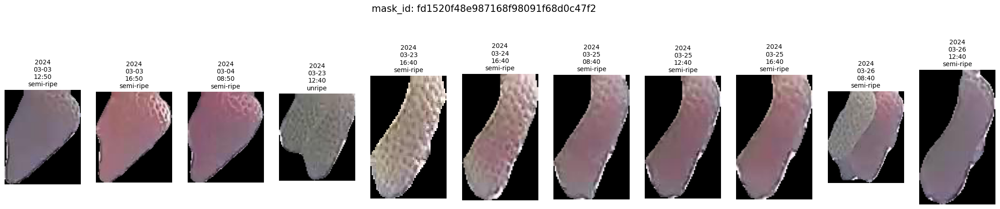

mask_id: f58deaa8833cd8cc03bb7d365211dccc


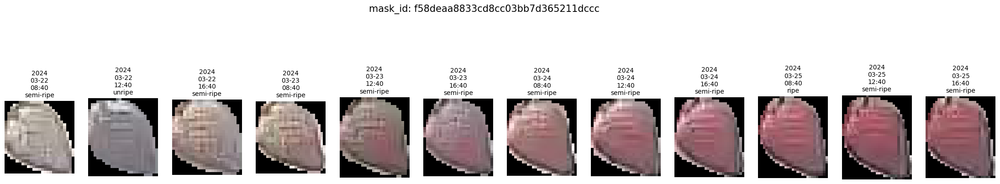

mask_id: fbd5a41a368754cd076f200ccaacf644


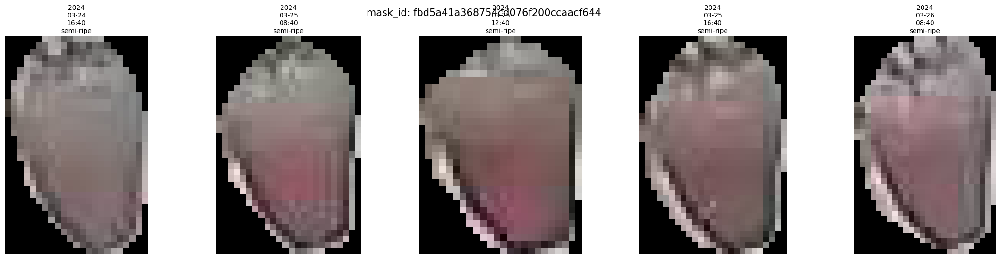

mask_id: 1c911cd8ac065b1581d408d7fe7666cc


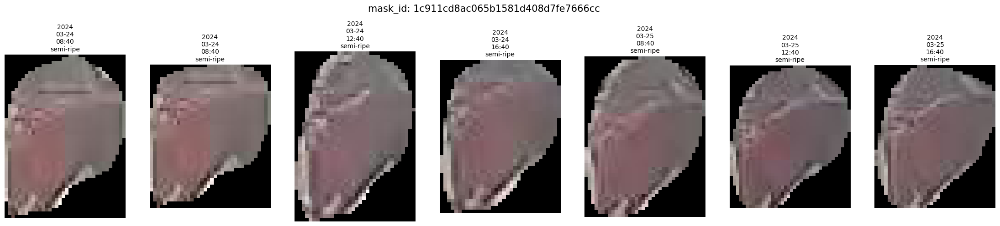

mask_id: bfad75f53ef82546301c9598058bfd7e


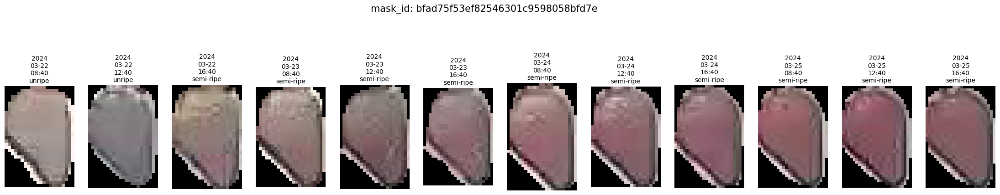

mask_id: f72f8095c6c411f070fe5c6b58c1f794


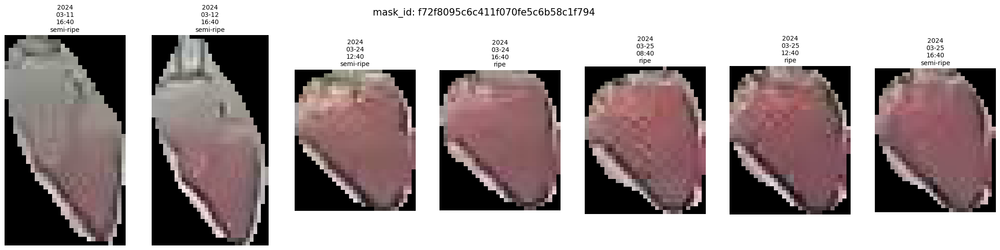

mask_id: 4324212bf0c794ff90cd1276ee1d5621


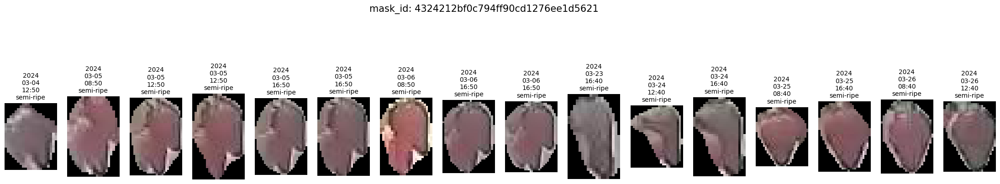

mask_id: ba902b068d9a351df6bad4ed98a1f68f


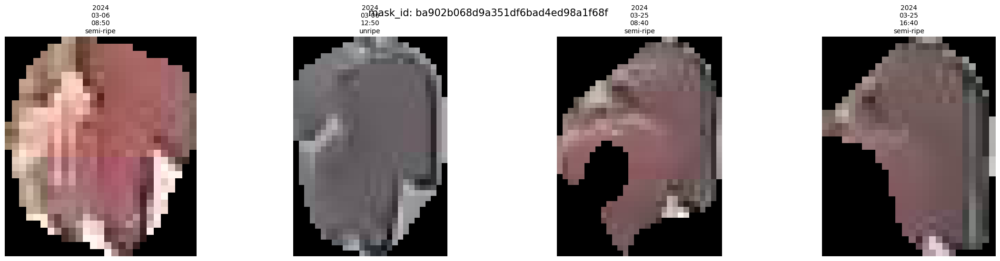

mask_id: 9e39f368fdeac0dc6e5cee7159b1c09b


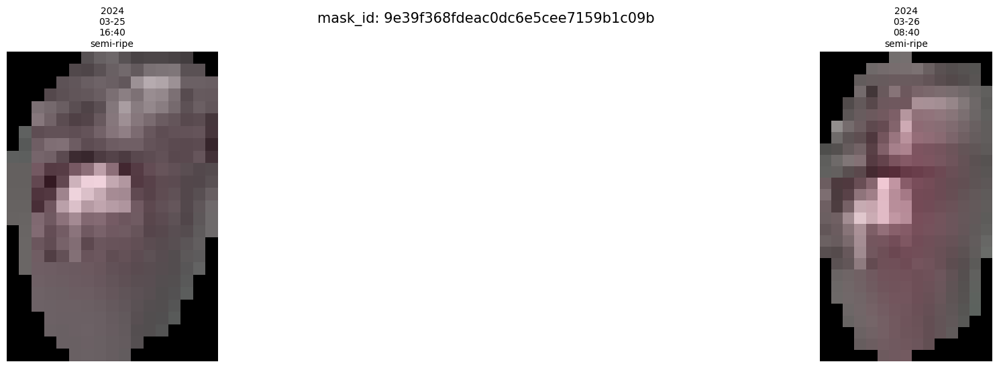

mask_id: 251edb01a8cc4656aad650b6bde49e5d


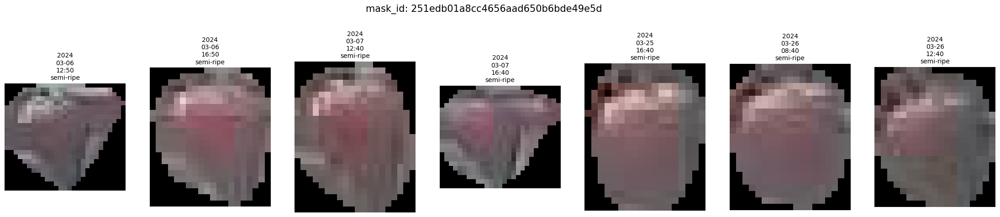

mask_id: de8742c6723d0c56874600dbe2296c52


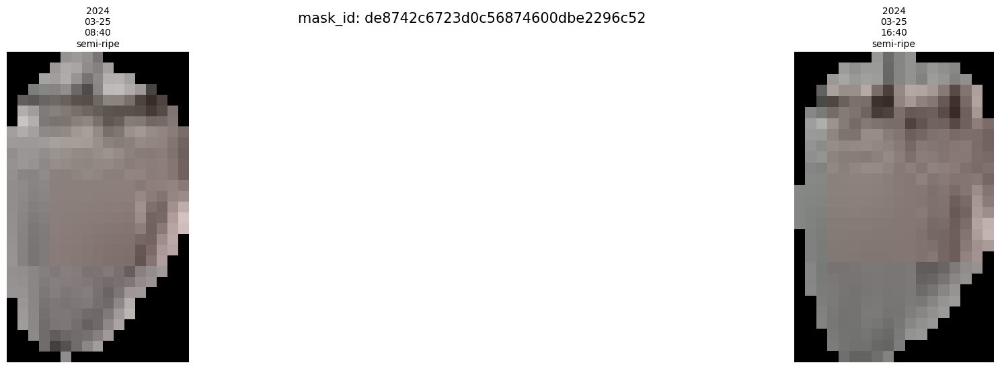

mask_id: c9823d69e7a4997f175d69c3b24434e1


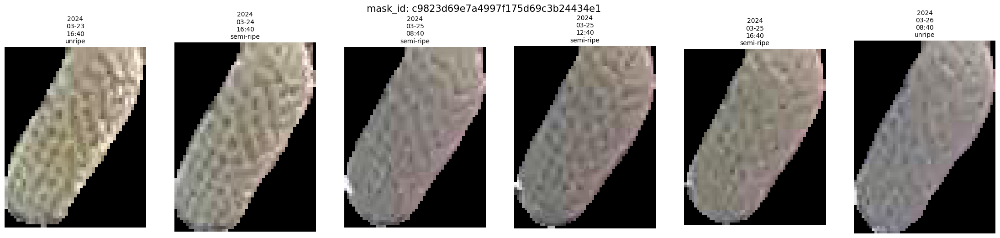

mask_id: c3ec90d059cbf4a82ba93e6e182aec52


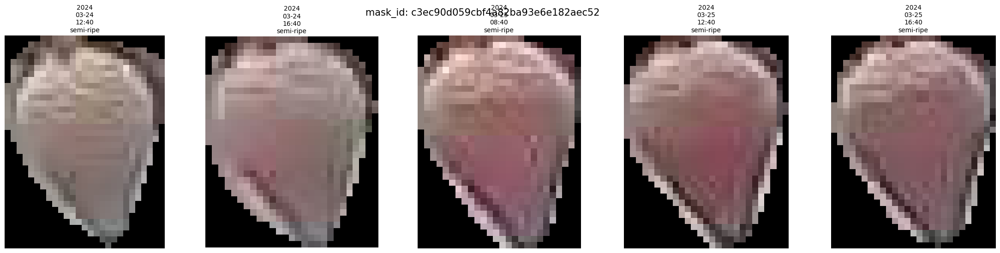

mask_id: 1e9d86bdbbe9d168857bd7ce7fc44238


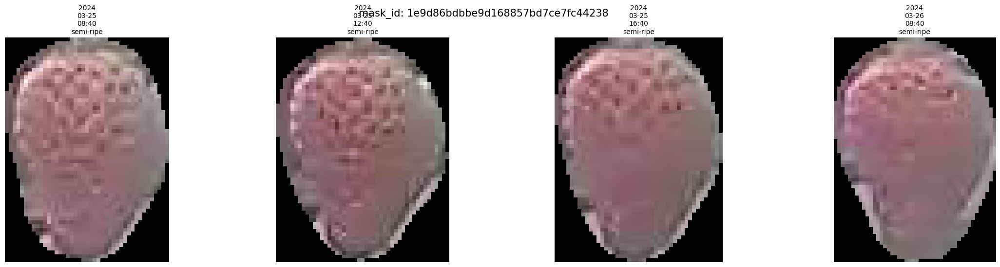

mask_id: 31945c312d775461165407cb6b77fe89


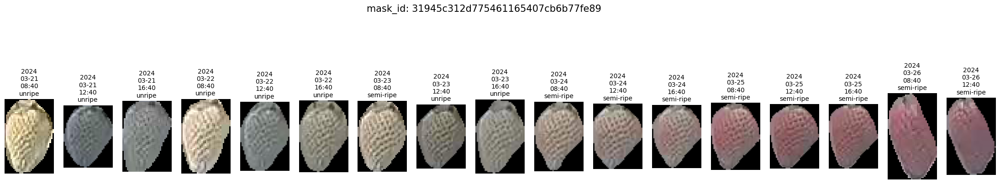

mask_id: 9e3b28875bb33fb933df5a384d32db05


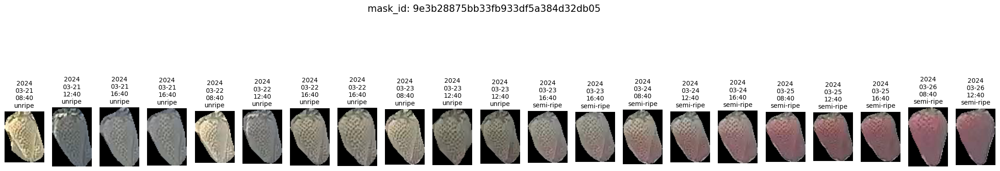

mask_id: fe08a509f07165816d012b2ddfb65af7


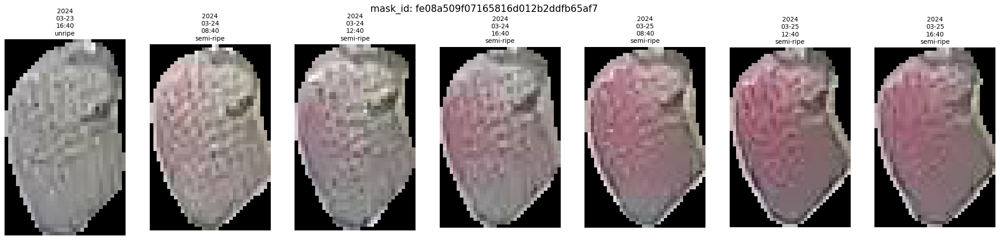

mask_id: 7c21b4f124f83029f6e5260796d60e70


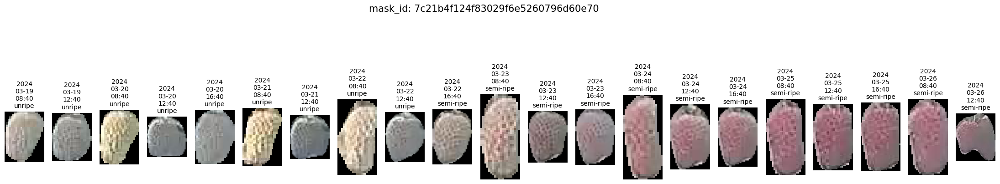

mask_id: 240987c5ebae69d2da4ff97b7bbf6d7c


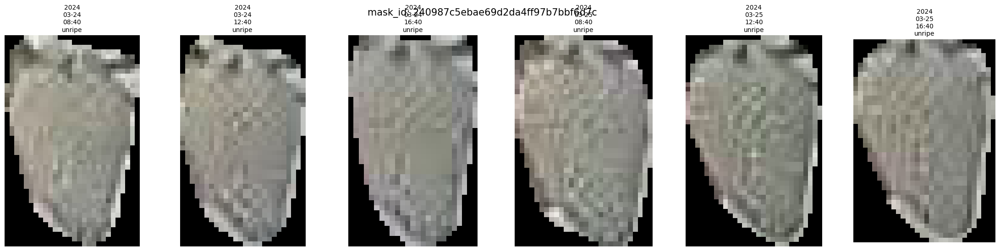

mask_id: 269175c9e7ed64a8e58fc91edce90c5b


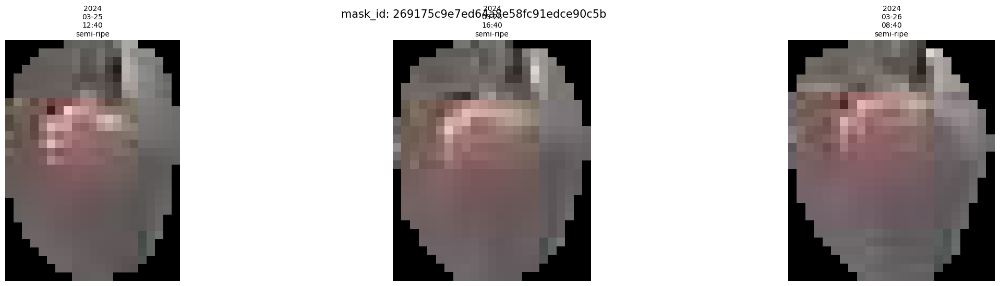

mask_id: 0d9f0fcc18cc6e28665a7ec62e6b36a9


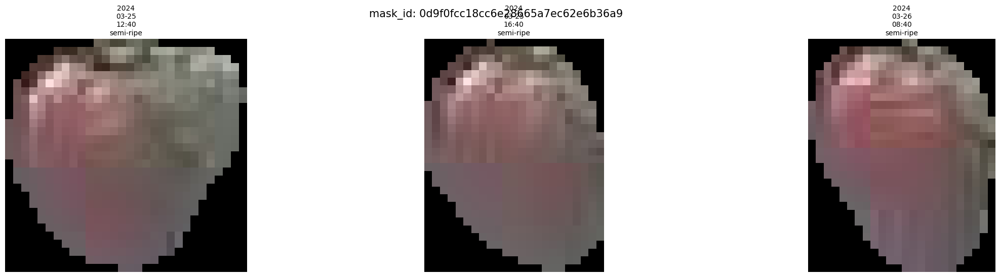

mask_id: eee9ab0dd480089ad539340d0699c81d


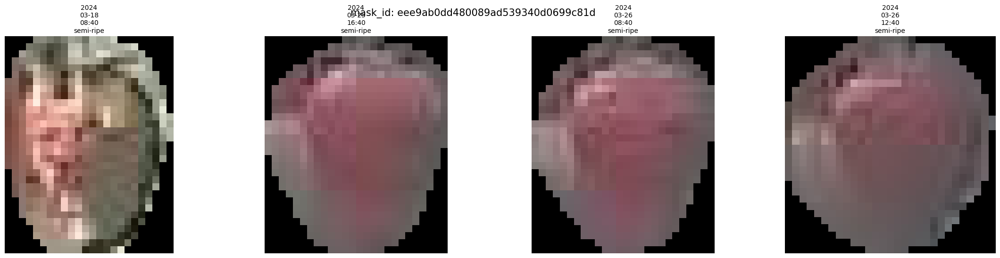

mask_id: de12de6d2c6c30850d0e3213ea0f5f53


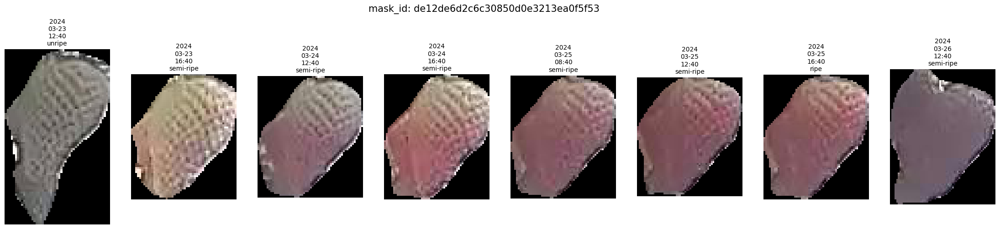

mask_id: 07e6cec6ec5bb907f76648ee12a726db


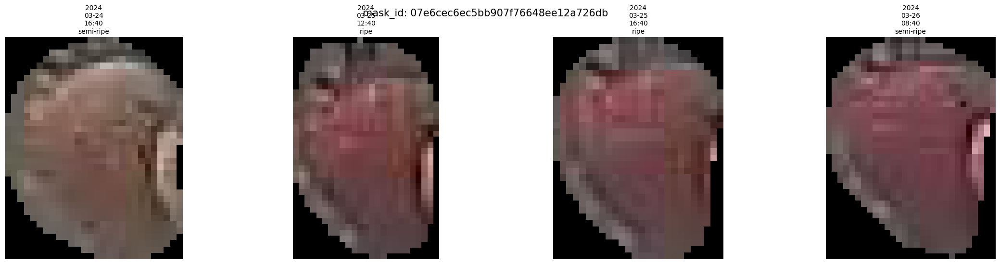

mask_id: 4c5b0b8052d3f41f33ccc9912f99d4fb


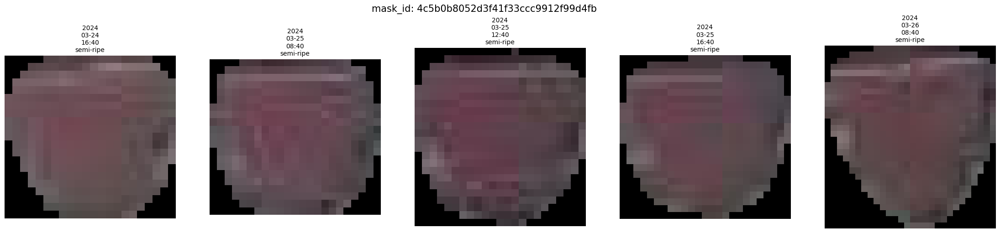

mask_id: 1b240cb953bfd5e6925e3c939d211c32


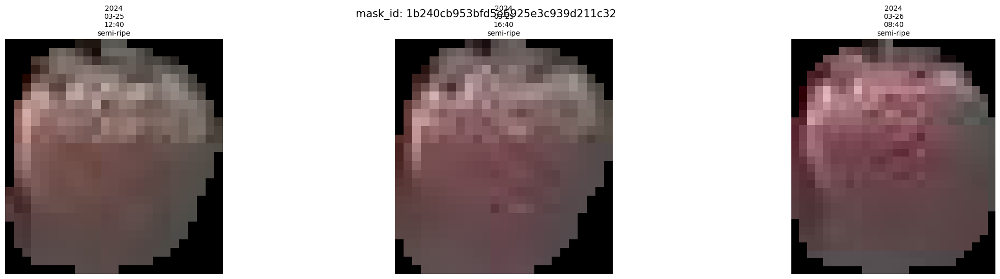

mask_id: 3e13eb37ab42aa111180a18790515a79


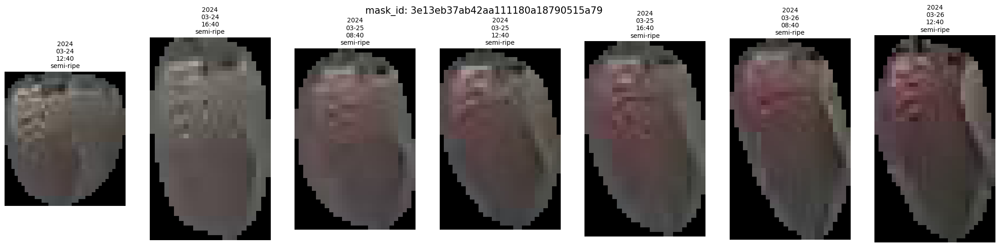

mask_id: 66d7363516223557cf19fdbaeffd4ef1


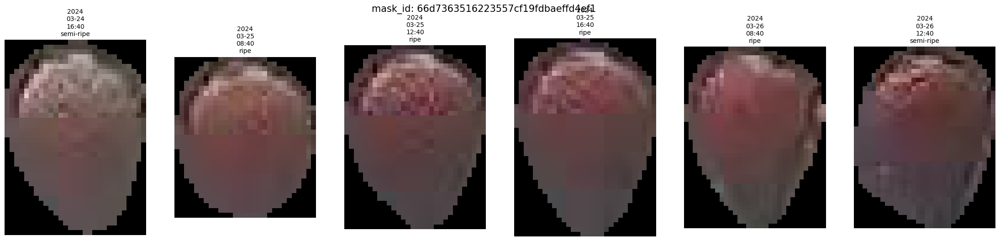

mask_id: 9df4a1f7158196de71d9dd679640e9fe


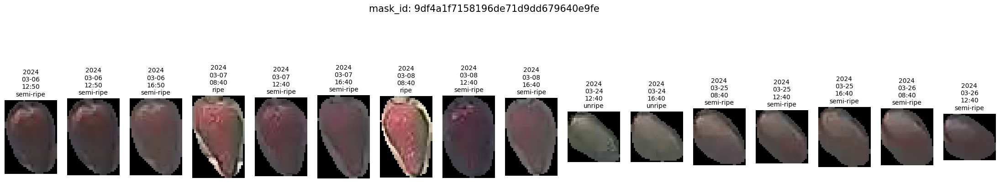

mask_id: 562c392ffa3ec479e9061f252500e168


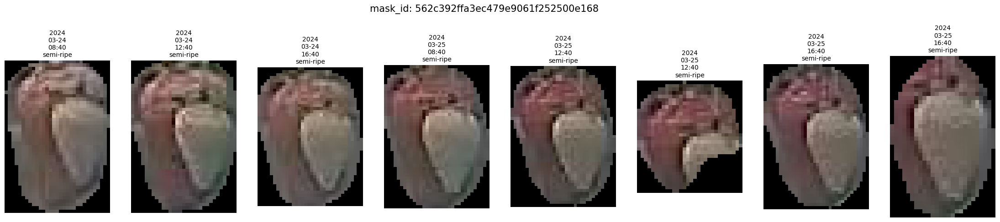

mask_id: 55a7516636a1d23126bb3be899456719


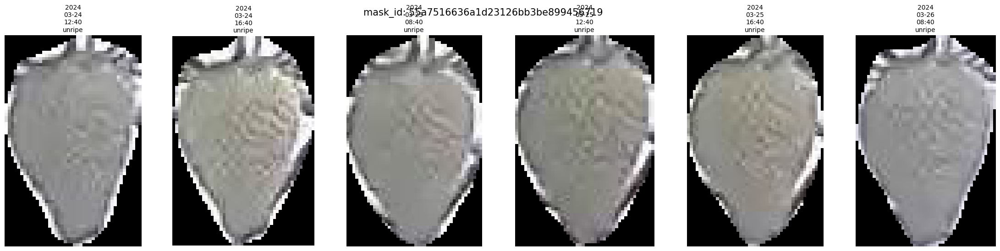

mask_id: f1a63a259b6228ad1c8c0ae0b03f67e5


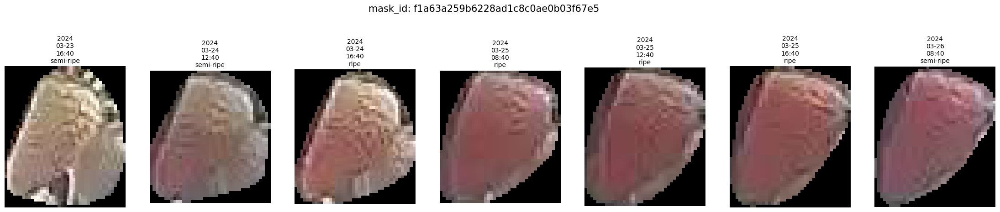

mask_id: 2431cdb2b70e44ed37e761045d16e748


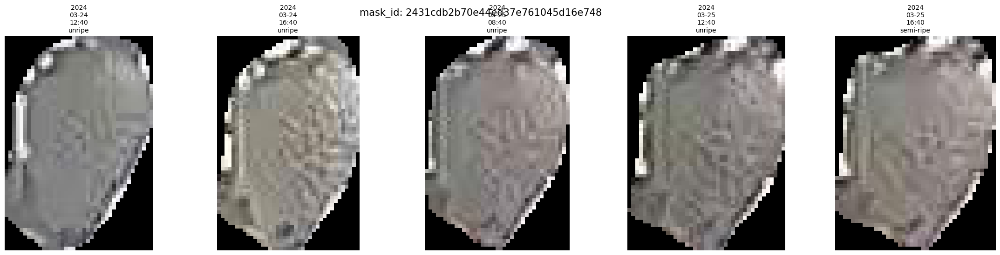

mask_id: 4e6991878610e6b2585ddf02b38f1c1b


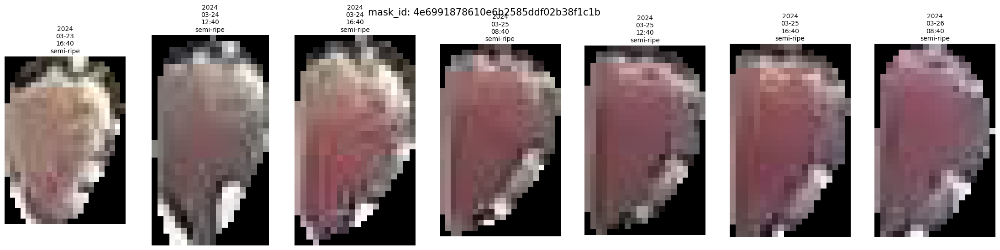

mask_id: 685da5524714faeb28dd42ad78207f07


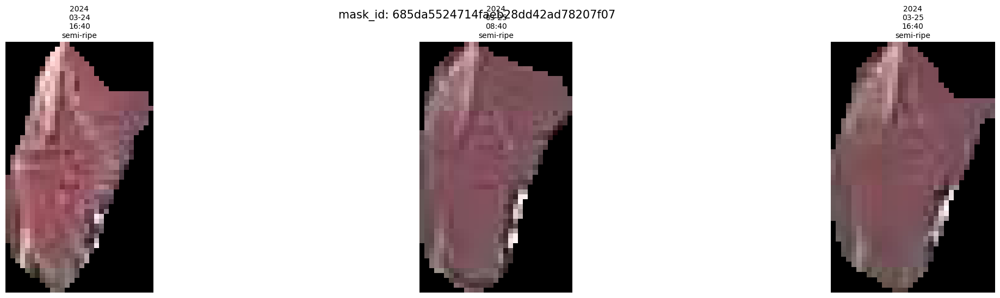

mask_id: 7bd836c92db2f20258cd55b9030d1ff3


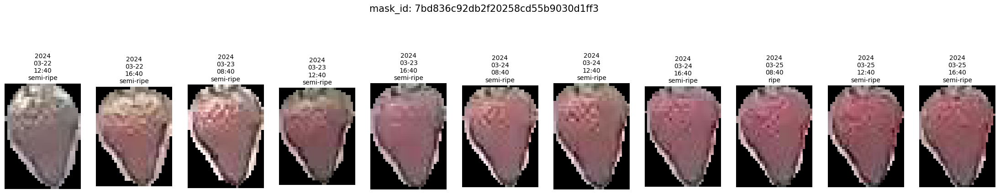

In [33]:
# 주어진 mask_id들이 포함된 데이터 추출
filtered_data = F0016_23_24_mar[F0016_23_24_mar['mask_id'].isin(img_data_16_23_mar['mask_id'].unique())]

# mask_id별로 최신 날짜순으로 정렬하고 필요한 정보 저장
mask_info_list = []
for mask_id in img_data_16_23_mar['mask_id'].unique():
    mask_data = filtered_data[filtered_data['mask_id'] == mask_id]
    sorted_mask_data = mask_data.sort_values(by='check_datetime', ascending=True)
    mask_info_list.append(sorted_mask_data)

# 각 mask_id별로 시각화
for mask_info in mask_info_list:
    mask_id = mask_info['mask_id'].iloc[0]

    # 각 mask_id를 출력
    print("mask_id:", mask_id)
    
    # 각 mask_id별로 등장한 일자순으로 시각화
    fig, axes = plt.subplots(1, len(mask_info), figsize=(28, 6))
    fig.suptitle(f'mask_id: {mask_id}', fontsize=15)
    
    for i, (_, row) in enumerate(mask_info.iterrows()):
        img_path = "/home/ubuntu/drive/dataset/SAM_result/F0016/C101/" + row['input_image_name'] + "/masks/" + row["output_image_path"]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # 이미지와 관련 정보 시각화
        check_datetime_formatted_year = row["check_datetime"].strftime("%Y")
        check_datetime_formatted_day = row["check_datetime"].strftime("%m-%d")
        check_datetime_formatted = row["check_datetime"].strftime("%H:%M")
        pred_growth = row["pred_growth"]
        title = f'{check_datetime_formatted_year}\n{check_datetime_formatted_day}\n{check_datetime_formatted}\n{pred_growth}'
        np.ravel(axes)[i].imshow(img)
        np.ravel(axes)[i].set_title(title, fontsize=10)
        np.ravel(axes)[i].axis('off')

    plt.show()